# EDA: Capstone 2

The objective here is to examine the relationship between the variables of the cleaned dataframes.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing 
import textstat
import nltk
from nltk.tokenize import WordPunctTokenizer
import re
from bs4 import BeautifulSoup
import spacy
from nltk.corpus import stopwords
import string
from wordcloud import WordCloud
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

### 2.1 Define functions for analysis

In [2]:
# Look at the distributions of percent change


def plot_histogram(df, var):
    sns.set()
    try:
        username = df.username[0]
    except:
        username = ''
    
    mean = df[var].mean()
    std = df[var].std()
    median = df[var].median()
    n_bins = int(np.sqrt(len(df)))
    _ = plt.hist(df[var], bins=n_bins)
    _ = plt.xlabel('{} with {} bins'.format(var, n_bins))
    _ = plt.ylabel('Counts')
    _ = plt.title('{}, mean={:.4f}, median={:.4f}, std={:.4f}'.format(username, mean, median, std))
    plt.show()
    
def pearson_r(x, y):
    """Compute Pearson correlation coefficient between two arrays."""
    # Compute correlation matrix: corr_mat
    corr_mat = np.corrcoef(x, y)

    # Return entry [0,1]
    return corr_mat[0,1]

def ecdf(series):
    x = np.sort(series)
    y = np.arange(1, len(x) + 1) / len(x)
    return x, y

def cdf(series):
    mean = np.mean(series)
    std = np.std(series)
    samples = np.random.normal(mean, std, size=len(series))
    x_theor, y_theor = ecdf(samples)
    
    return x_theor, y_theor
    
def plot_ecdf(x, y):
    sns.set()
    percentiles = np.array([2.5, 25, 50, 75, 97.5])
    pcnt_vers = np.percentile(x, percentiles)
    _ = plt.plot(x, y, marker='.', linestyle='none')
    _ = plt.plot(pcnt_vers, percentiles/100, marker='D', color='red',
         linestyle='none')
    _ = plt.ylabel('ECDF')

    plt.show()


# 2.2 Read in data and examine

In [3]:
Benioff_df = pd.read_pickle('benioff_df.pkl')
#carl_c_icahn_df = pd.read_pickle('carl_c_icahn_df.pkl')
elonmusk_df = pd.read_pickle('elonmusk_df.pkl')
jack_df = pd.read_pickle('jack_df.pkl')
jeremys_df = pd.read_pickle('jeremys_df.pkl')
levie_df = pd.read_pickle('levie_df.pkl')
sundarpichai_df = pd.read_pickle('sundarpichai_df.pkl')
tim_cook_df = pd.read_pickle('tim_cook_df.pkl')

In [4]:
CEOS = {'Benioff':Benioff_df, 'elonmusk':elonmusk_df, 'jack':jack_df, 'jeremys':jeremys_df,
        'levie':levie_df, 'sundarpichai':sundarpichai_df, 'tim_cook' :tim_cook_df}



In [5]:
for CEO in CEOS:
    print(CEO.upper())
    print(CEOS[CEO].info())
    print('\n')

BENIOFF
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1889 entries, 0 to 1897
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              1889 non-null   datetime64[ns]
 1   tweet             1889 non-null   object        
 2   username          1889 non-null   object        
 3   mentions          1889 non-null   int64         
 4   hashtags          1889 non-null   int64         
 5   video             1889 non-null   int64         
 6   photos            1889 non-null   int64         
 7   urls              1889 non-null   int64         
 8   thumbnail         1889 non-null   int64         
 9   replies_count     1889 non-null   int64         
 10  retweets_count    1889 non-null   int64         
 11  likes_count       1889 non-null   int64         
 12  number of tweets  1889 non-null   int64         
 13  tweet length      1889 non-null   int64         
 14  price           

In [6]:
for CEO in CEOS:
    print(CEO.upper())
    print(CEOS[CEO].describe())
    print('\n')

BENIOFF
          mentions     hashtags        video       photos         urls  \
count  1889.000000  1889.000000  1889.000000  1889.000000  1889.000000   
mean      1.284277     0.176813     1.100053     0.897830     1.402859   
std       1.527007     0.506810     1.277264     1.101636     1.496186   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       1.000000     0.000000     1.000000     1.000000     1.000000   
75%       2.000000     0.000000     2.000000     1.000000     2.000000   
max      28.000000     7.000000     9.000000     9.000000    11.000000   

         thumbnail  replies_count  retweets_count   likes_count  \
count  1889.000000    1889.000000     1889.000000   1889.000000   
mean      1.100053      34.436739      208.529381    893.692959   
std       1.277264      63.783527      389.575129   1520.143559   
min       0.000000       0.000000        0.000000      0.

In [7]:
# Examine the data

for CEO in CEOS:
    print(CEO)
    print(CEOS[CEO].shape)

Benioff
(1889, 17)
elonmusk
(2177, 17)
jack
(1415, 17)
jeremys
(473, 17)
levie
(953, 17)
sundarpichai
(473, 17)
tim_cook
(769, 17)


# 2.3 Explore the data

## 2.3.1 Look at the relationships between the numerical features

In [8]:
data = CEOS['elonmusk'][['date', 'replies_count', 'retweets_count', 'likes_count',
                        'video', 'photos', 'urls', 'thumbnail','number of tweets', 'tweet length', 'price', 'percent change']].copy()
data.describe()

,replies_count,retweets_count,likes_count,video,photos,urls,thumbnail,number of tweets,tweet length,price,percent change
count,2177.000000,2177.000000,2.177000e+03,2177.000000,2177.000000,2177.000000,2177.000000,2177.000000,2177.000000,2177.000000,2177.000000
mean,5071.054203,13718.641249,1.359303e+05,0.316491,0.286633,0.374368,0.316491,5.276527,473.869545,190.899553,0.001968
std,12778.098842,31473.633623,2.579419e+05,0.668672,0.636346,0.742577,0.668672,5.437966,600.814505,228.413990,0.025777
min,6.000000,3.000000,9.500000e+01,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,35.793999,-0.118469
25%,391.000000,614.000000,1.058500e+04,0.000000,0.000000,0.000000,0.000000,2.000000,114.000000,55.520000,-0.009924
50%,1298.000000,3078.000000,4.081200e+04,0.000000,0.000000,0.000000,0.000000,3.000000,273.000000,67.982002,0.001286
75%,3971.000000,12538.000000,1.401210e+05,0.000000,0.000000,1.000000,0.000000,7.000000,596.000000,199.302663,0.012813
max,205516.000000,585109.000000,4.740108e+06,6.000000,6.000000,6.000000,6.000000,48.000000,6926.000000,891.380005,0.171549


In [9]:
for CEO in CEOS:
    print(CEO)
    print(CEOS[CEO][['number of tweets', 'tweet length']].describe())

Benioff
       number of tweets  tweet length
count       1889.000000   1889.000000
mean           2.625728    450.130228
std            2.424538    465.649273
min            1.000000     11.000000
25%            1.000000    173.000000
50%            2.000000    293.000000
75%            3.000000    565.000000
max           31.000000   4908.000000
elonmusk
       number of tweets  tweet length
count       2177.000000   2177.000000
mean           5.276527    473.869545
std            5.437966    600.814505
min            1.000000      1.000000
25%            2.000000    114.000000
50%            3.000000    273.000000
75%            7.000000    596.000000
max           48.000000   6926.000000
jack
       number of tweets  tweet length
count       1415.000000   1415.000000
mean           3.544170    258.634629
std            7.495543    680.061345
min            1.000000      1.000000
25%            1.000000     52.000000
50%            2.000000    103.000000
75%            3.000000    2

In [10]:
data.nunique()

date                2177
replies_count       1708
retweets_count      1915
likes_count         2147
video                  7
photos                 7
urls                   7
thumbnail              7
number of tweets      38
tweet length         976
price               2135
percent change      2174
dtype: int64

Let's see the cleaned tweets

In [11]:
CEOS['elonmusk'][['cleaned tweet']]

,cleaned tweet
0,exactly i love twitter wrong to exclude non oc...
1,because of course i hate flamingosmaybe try ea...
2,cool thanks the google term of self driving wo...
3,true good point no you were misleading mostly ...
4,story was fed to lat many other media to count...
...,...
2180,should i bring a few spare engines i mean just...
2181,first one to fly will so booster booster will ...
2182,once you have rapidly reusable rockets of suff...
2183,will look pretty wild with a ship on top super...


Let's look at the distributions of the data

In [12]:
CEOS_list = list(CEOS.keys())
tweets_stocks = CEOS[CEOS_list[0]]

for i in range(len(CEOS_list[1:])):
    tweets_stocks = pd.concat([tweets_stocks, CEOS[CEOS_list[i+1]]], ignore_index=True)

In [13]:
columns = [
            'replies_count', 'retweets_count', 'likes_count', 
           'video', 'photos', 'thumbnail', 'urls', 'hashtags',
           'number of tweets', 'tweet length', 
           'price','percent change'
]
data = tweets_stocks[columns].copy()

In [14]:
report = sv.analyze(data)

                                             |          | [  0%]   00:00 -> (? left)


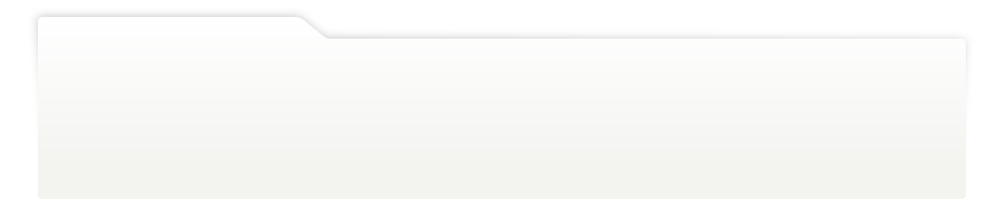
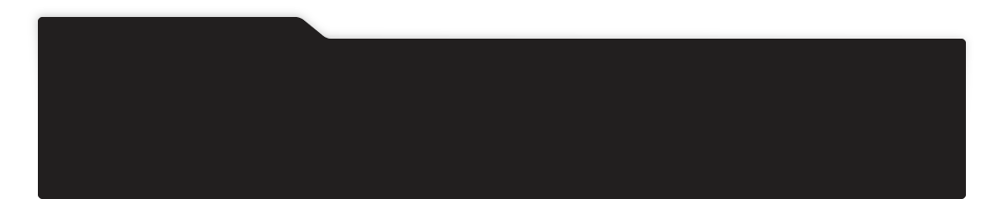
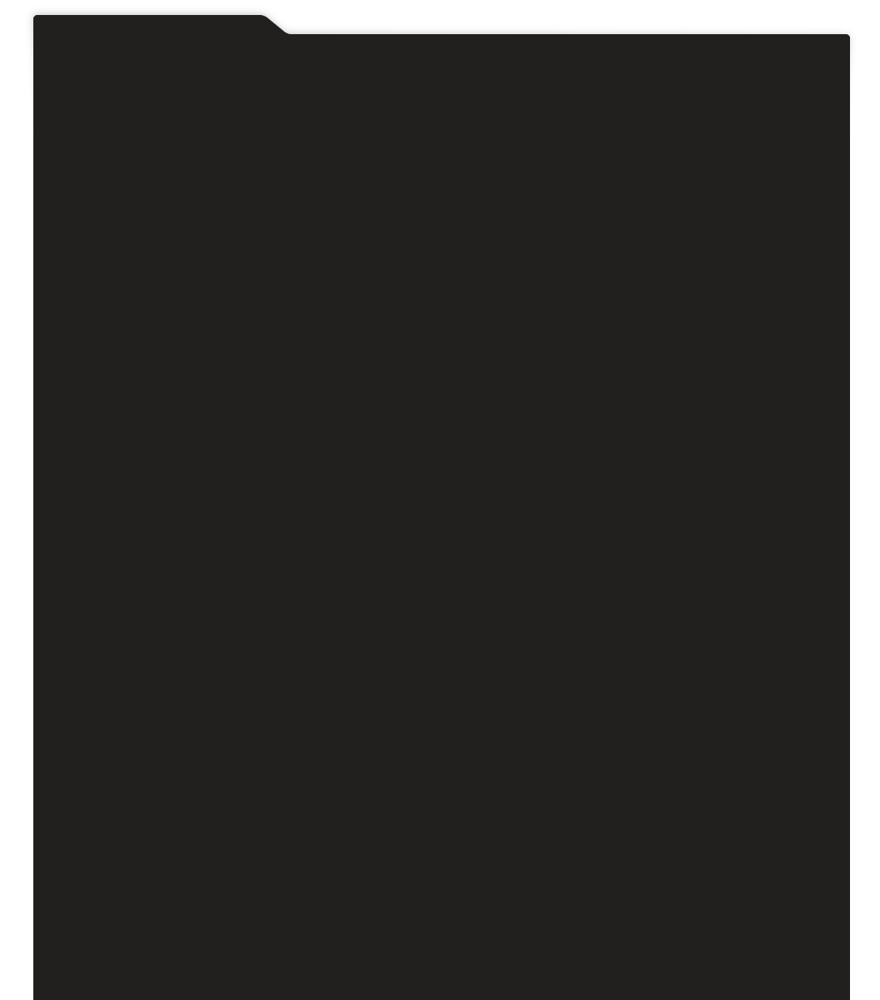
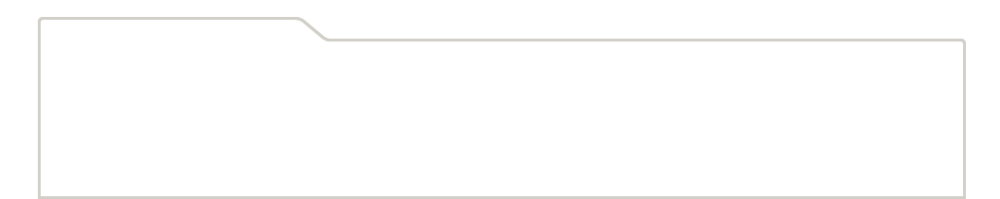
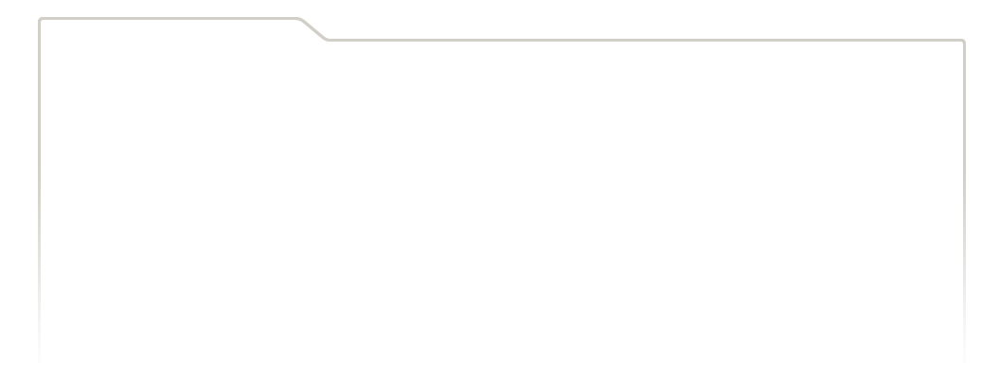
...
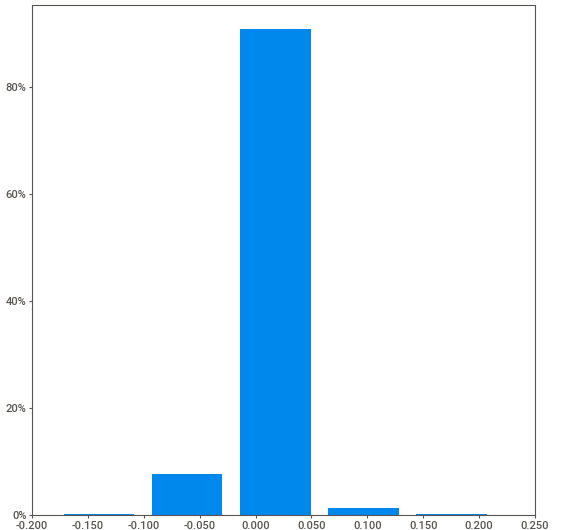
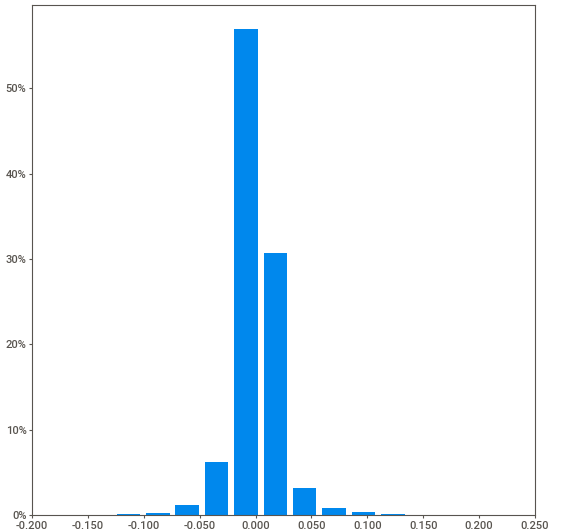
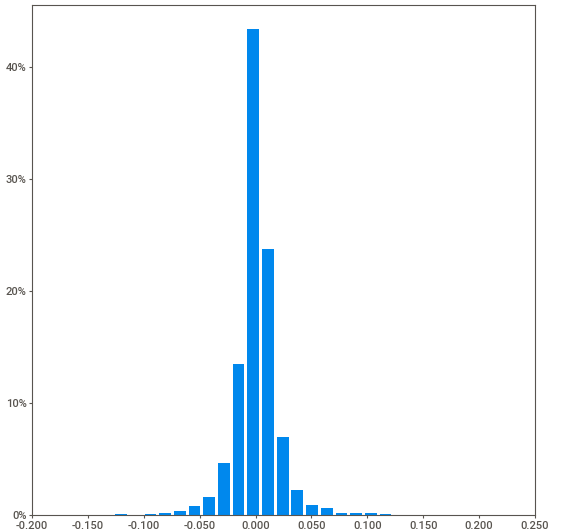
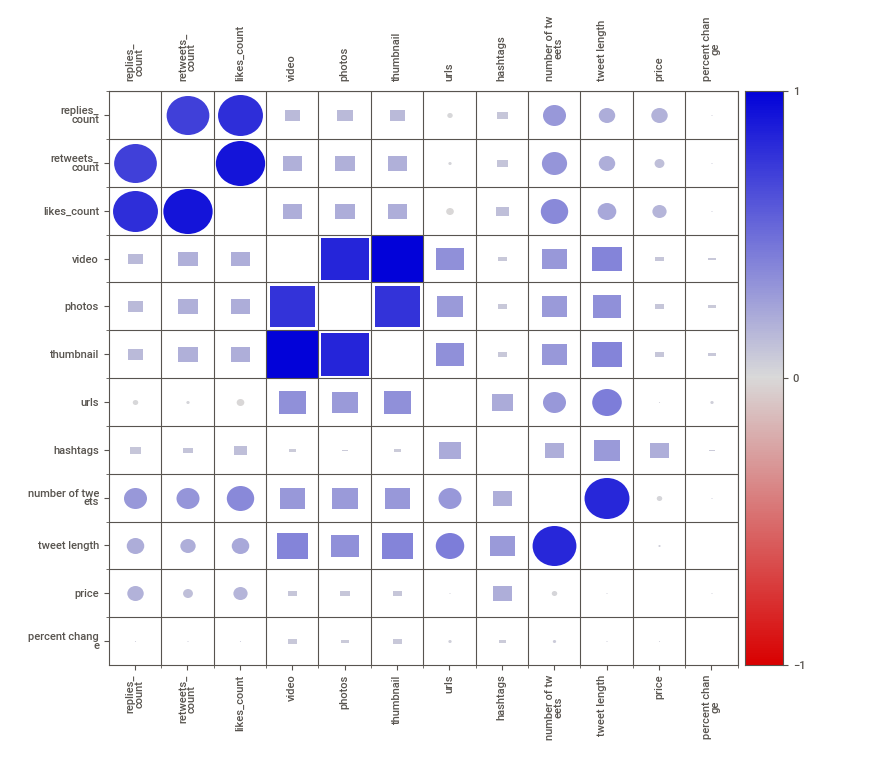
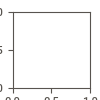

In [15]:
report.show_notebook()

Much of the data have a long tail, and so a tranformation would help to better understand their relationships. Regardless, we see that there are some strong correlations with the categorical variables, with photos, thumbnails, and videos. If we look at percent change, our target variable, there are very little correlations, with the highest pearson correlation being 0.02 for number of tweets, retweets_count, tweet_length, and likes_count. As these four variables are also highly correlated, it makes sense that they would have similar correlations to the percent change. What is interesting is that the stock price is more highly correlated (albeit still low) with replies_count (pearson of 0.14), likes_count (pearson of 0.13), and number of hashtags (0.16). Let's look at the distributions of some of these data to see if any would benefit from a power transformation.

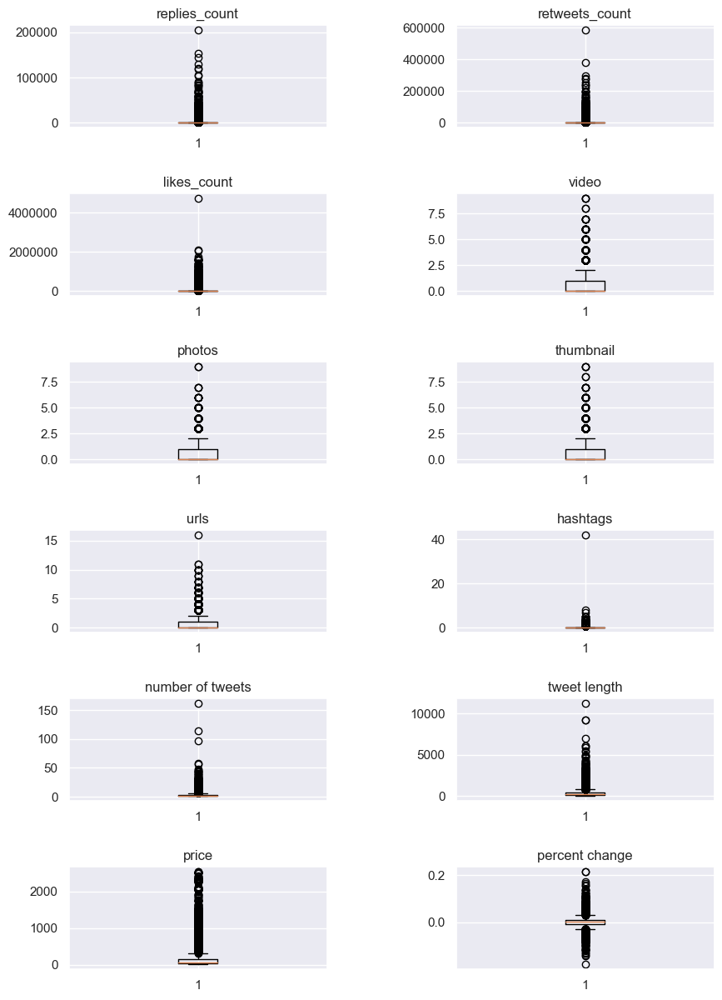

In [16]:
sns.set()
fig, ax = plt.subplots(6, 2, figsize = (10, 15))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.65)
for i in range(6):
      for j in range(2):
            _ = ax[i,j].boxplot(data[columns[2*i+j]])
            _ = ax[i,j].set_title(columns[2*i+j])
plt.show()

These data are highly skewed with long tails, with the exception of percent change, so let's take a log transformation of them to see if that improves some of the correlations.

In [17]:
data_trans = data.drop('percent change', axis=1)

In [18]:
data_trans = np.log(data_trans, where=data_trans > 1)

In [19]:
data_trans['percent change'] = data['percent change']

In [20]:
data_trans.describe()

,replies_count,retweets_count,likes_count,video,photos,thumbnail,urls,hashtags,number of tweets,tweet length,price,percent change
count,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000,8149.000000
mean,4.441462,5.454177,7.469580,0.089583,0.072453,0.089583,0.132404,0.015107,0.700340,5.277308,4.309444,0.000951
std,2.465434,2.604858,2.778328,0.293227,0.259151,0.293227,0.355918,0.121507,0.824493,1.076747,1.162483,0.020212
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.203869,-0.179500
25%,2.708050,3.951244,5.796058,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.624973,3.497113,-0.006851
50%,4.369448,5.476464,7.362645,0.000000,0.000000,0.000000,0.000000,0.000000,0.693147,5.323010,4.110382,0.000789
75%,6.047372,7.083388,9.245321,0.000000,0.000000,0.000000,0.000000,0.000000,1.098612,5.934894,4.993964,0.008452
max,12.233279,13.279553,15.371570,2.197225,2.197225,2.197225,2.772589,3.737670,5.087596,9.324651,7.840341,0.214807


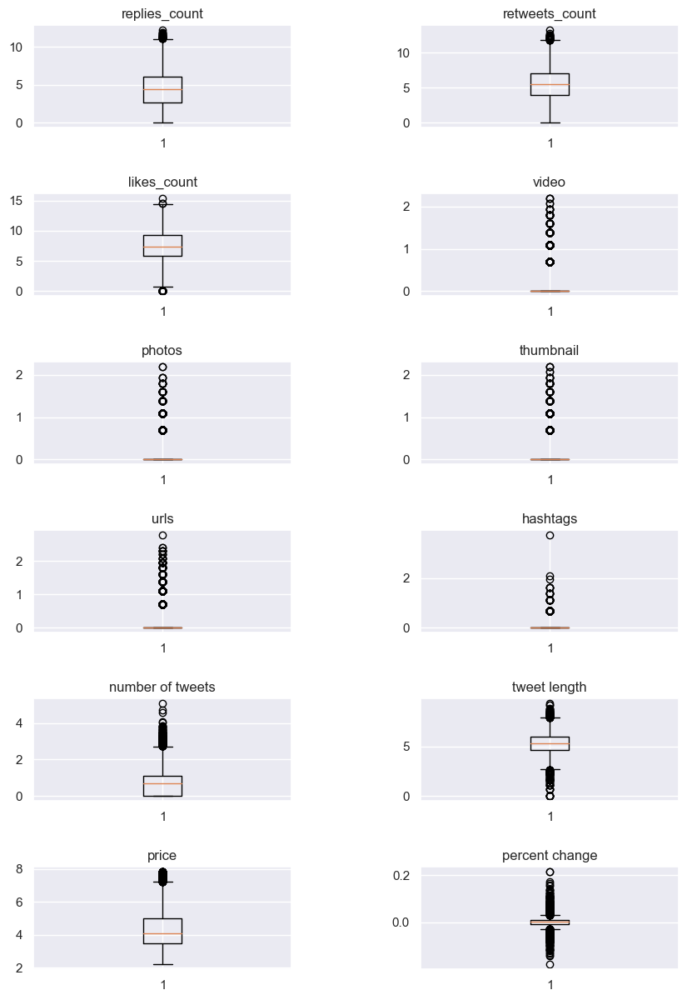

In [21]:
sns.set()
fig, ax = plt.subplots(6, 2, figsize = (10, 15))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.65)
for i in range(6):
      for j in range(2):
            _ = ax[i,j].boxplot(data_trans[columns[2*i+j]])
            _ = ax[i,j].set_title(columns[2*i+j])
plt.show()

In [22]:
report = sv.analyze(data_trans)

                                             |          | [  0%]   00:00 -> (? left)


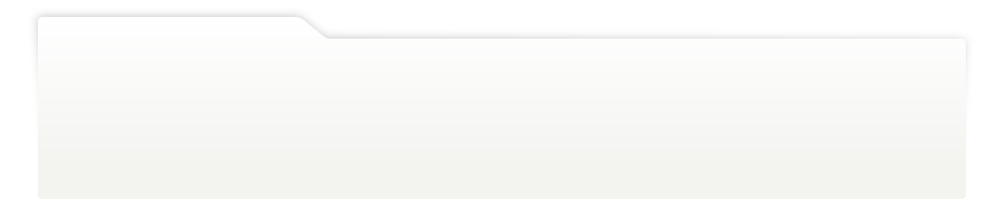
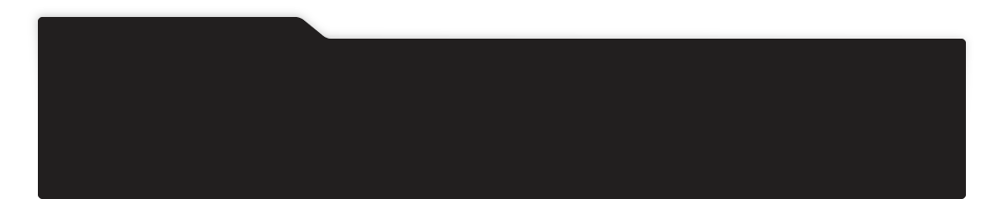
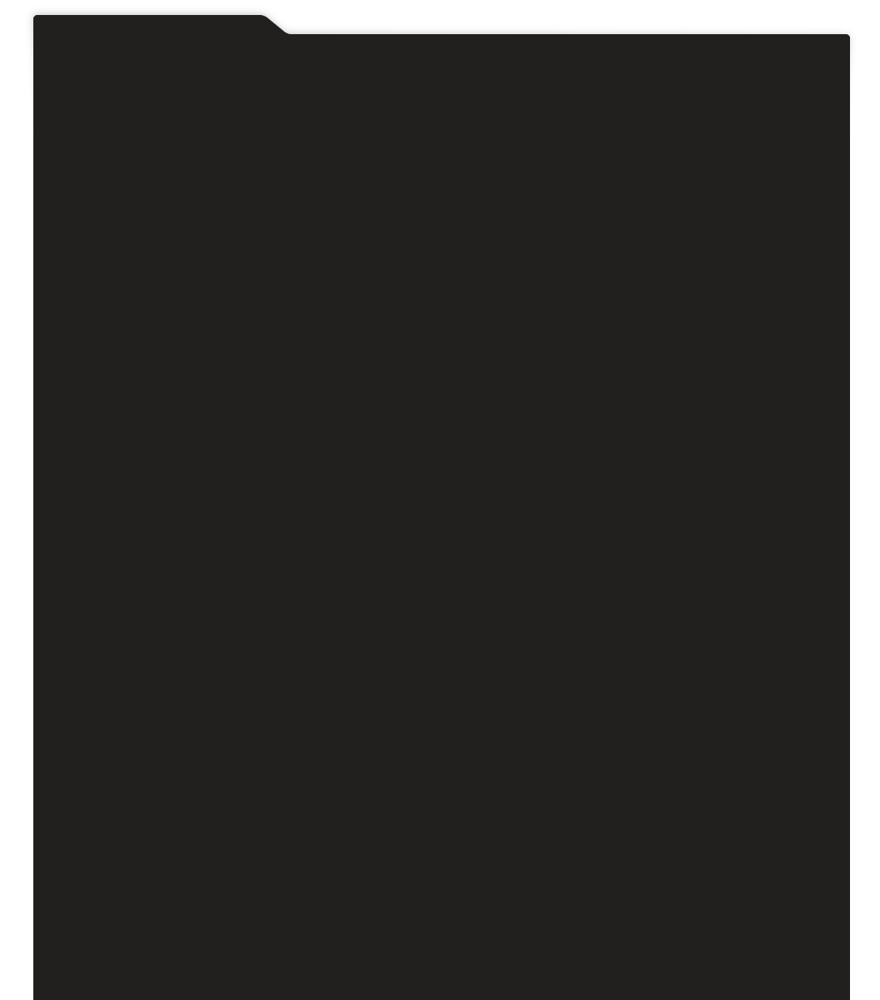
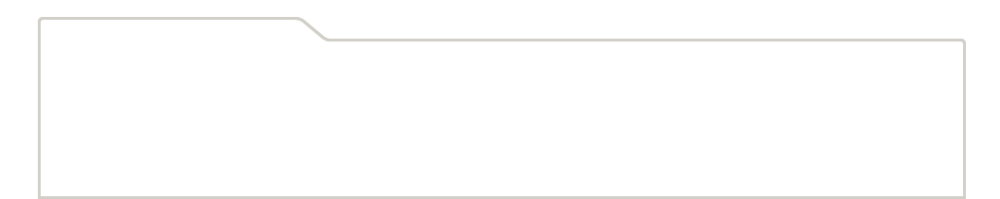
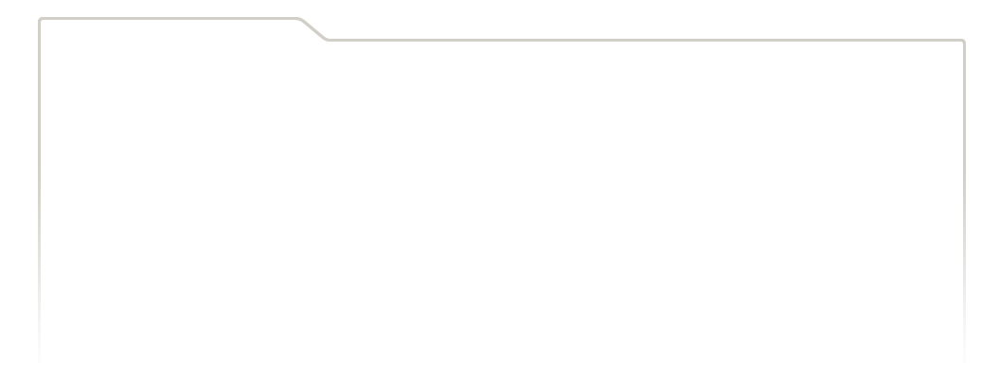
...
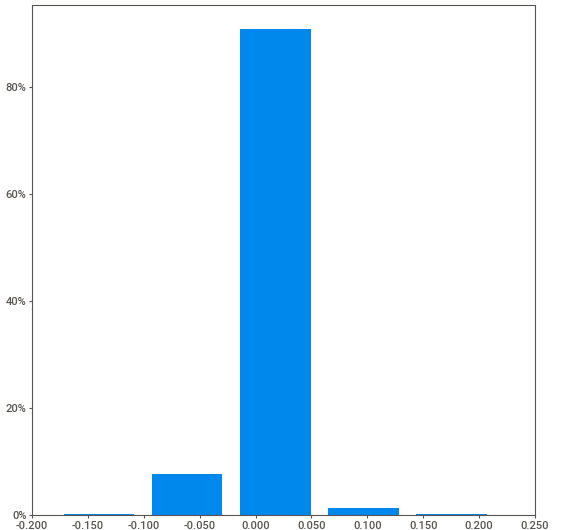
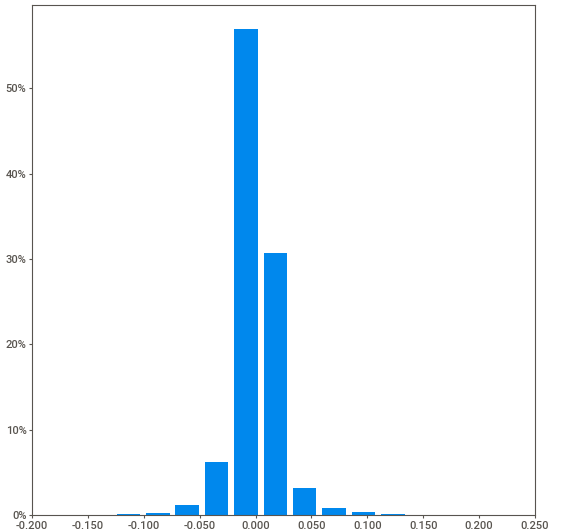
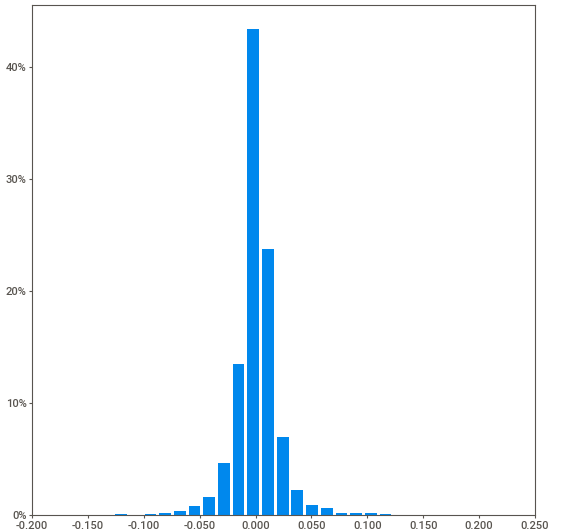
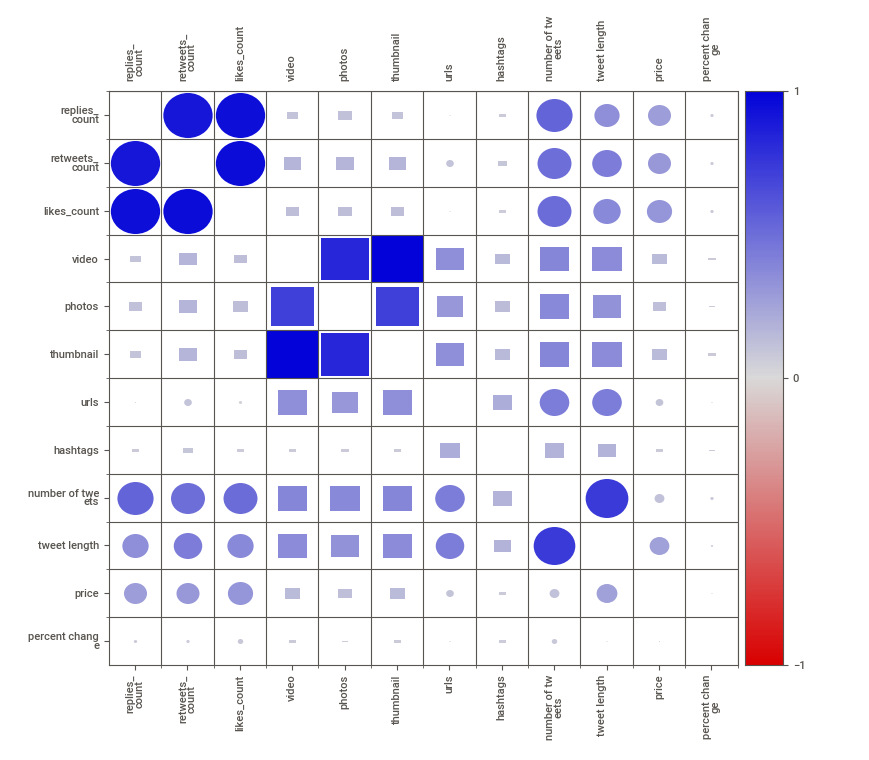
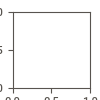

In [23]:
report.show_notebook()

The log tranformation for replies_count, likes_count, retweets_count, and tweet length look more normally distributed. In doing these tranformations, the correlations for price and percent change with the other variables have slightly improved, with a 0.28 pearson correlation of price with likes_count and a 0.03 correlation of percent change with likes_count (up from 0.02). Let's look at the distributions of these data with ecdf plots.

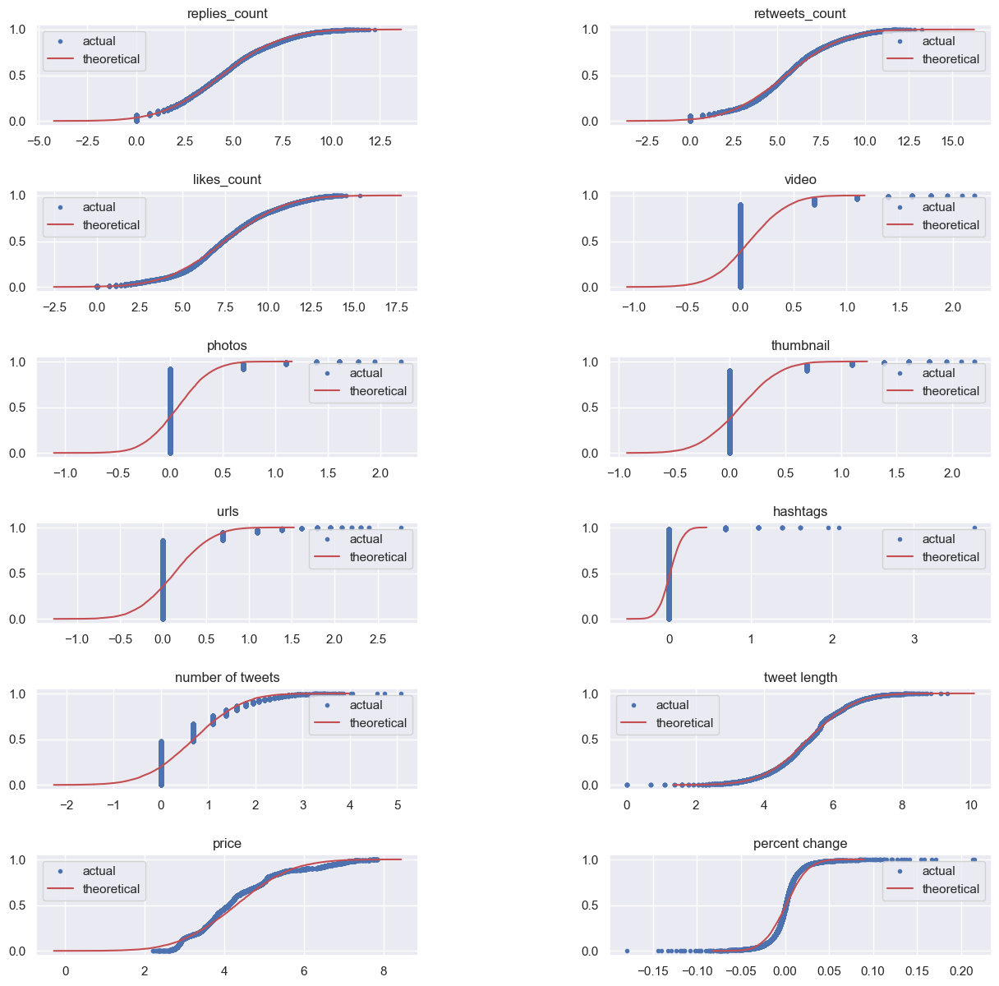

In [25]:
sns.set()
fig, ax = plt.subplots(6, 2, figsize = (15, 15))

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.65)
for i in range(6):
      for j in range(2):
                
            x, y = ecdf(data_trans[columns[2*i+j]]) 
            x_theor, y_theor = cdf(data_trans[columns[2*i+j]])


            _ = ax[i,j].plot(x, y, marker='.', linestyle='none')
            _ = ax[i,j].plot(x_theor, y_theor, color='r')
            _ = ax[i,j].legend(['actual', 'theoretical'])
            _ = ax[i,j].set_title(columns[2*i+j])
plt.show()

The categoricals didn't fare so well (photos, hashtags, video, thumbnail, and urls). Let's do a Box-Cox plot to see what better moves them to a more normal distribution pattern.

In [26]:
box_cox_cols = ['number of tweets', 'tweet length', 'price']

In [27]:
data[box_cox_cols].min()

number of tweets    1.00
tweet length        1.00
price               9.06
dtype: float64

In [29]:
from scipy import stats

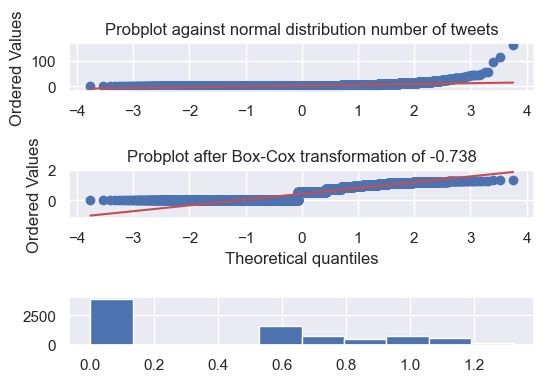

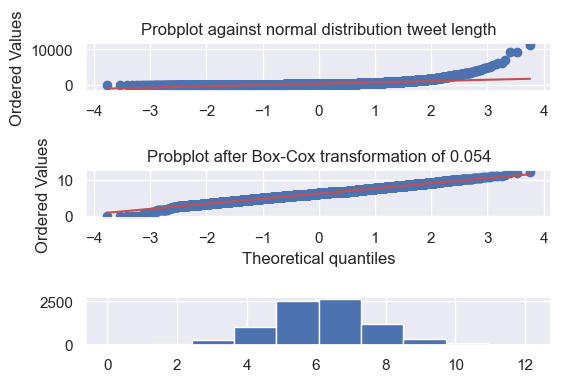

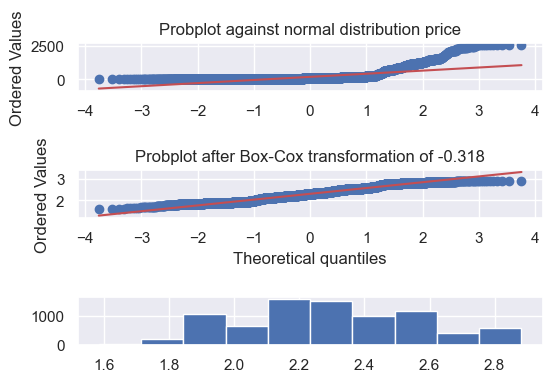

In [30]:
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.boxcox.html
for column in box_cox_cols:
    fig = plt.figure()
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=1.5, hspace=1.65)
    ax1 = fig.add_subplot(311)
    x = data[column]
    prob = stats.probplot(x, dist=stats.norm, plot=ax1)
    ax1.set_xlabel('')
    ax1.set_title('Probplot against normal distribution {}'.format(column))

    ax2 = fig.add_subplot(312)
    xt, params = stats.boxcox(x)
    prob = stats.probplot(xt, dist=stats.norm, plot=ax2)
    ax2.set_title('Probplot after Box-Cox transformation of {:.3f}'.format(params))
    
    ax3 = fig.add_subplot(313)
    ax3.hist(xt)

    plt.show()

In [ ]:
data

In [31]:
data_trans['number of tweets'] = ((data['number of tweets']**-.738-1)/-.738)

In [32]:
data_trans['tweet length'] = ((data['tweet length']**0.054-1/.054))
data_trans['price'] = ((data['price']**-.318-1/-.318))

                                             |          | [  0%]   00:00 -> (? left)


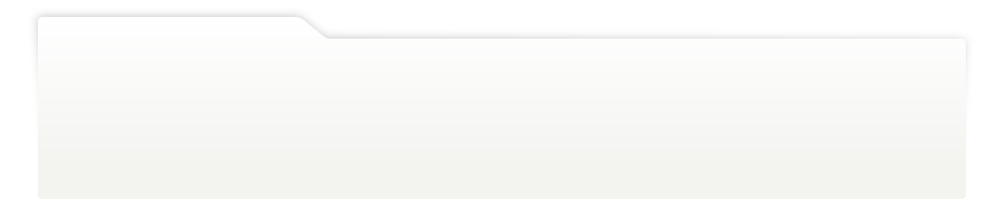
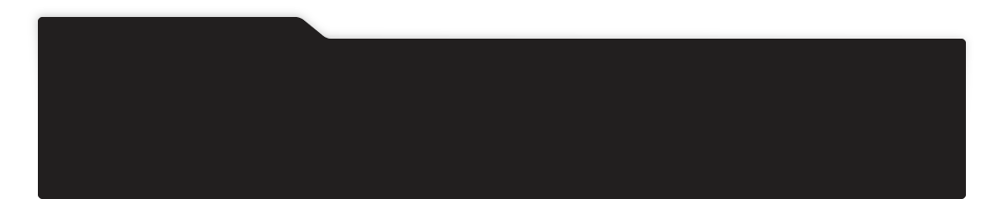
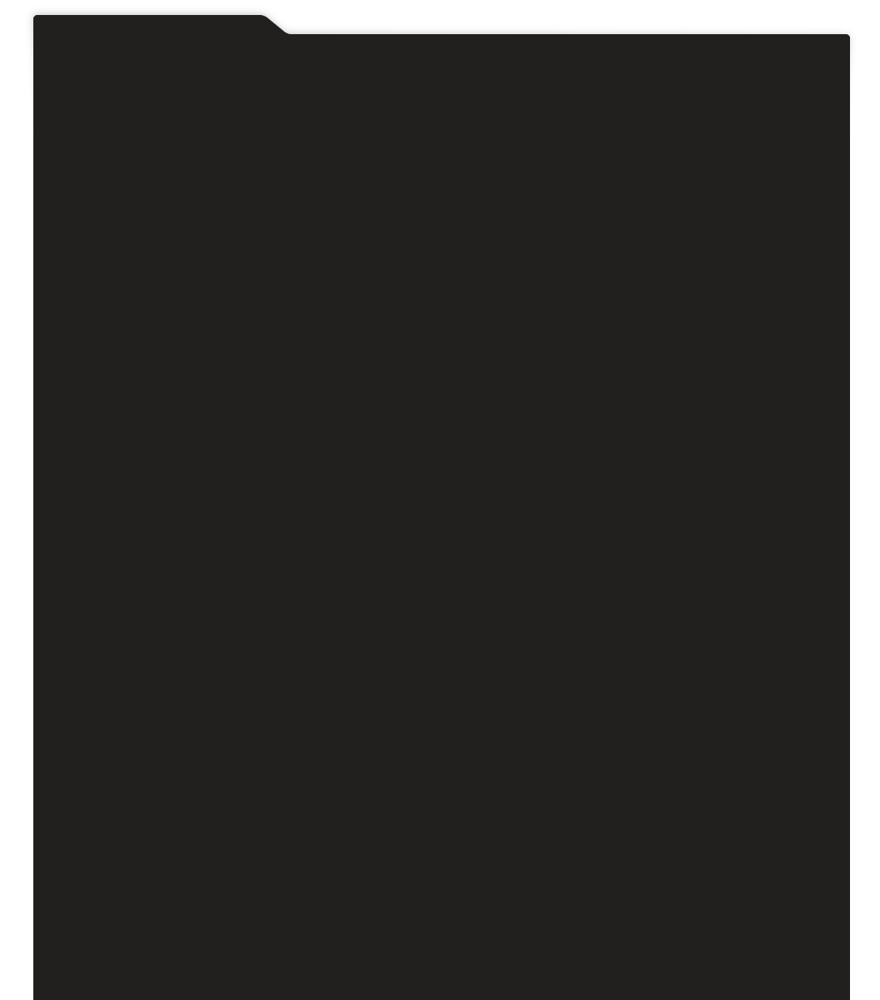
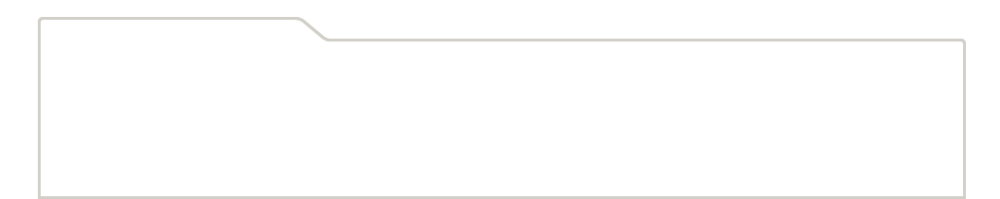
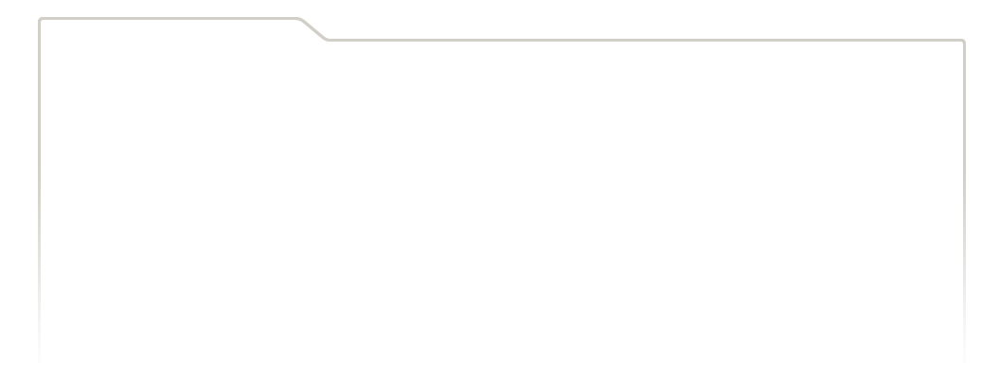
...
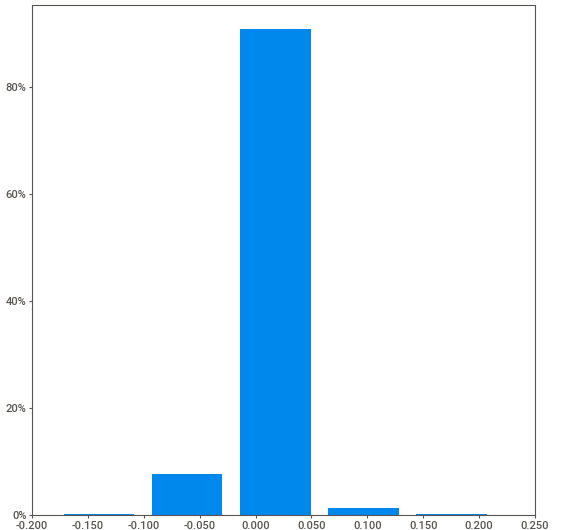
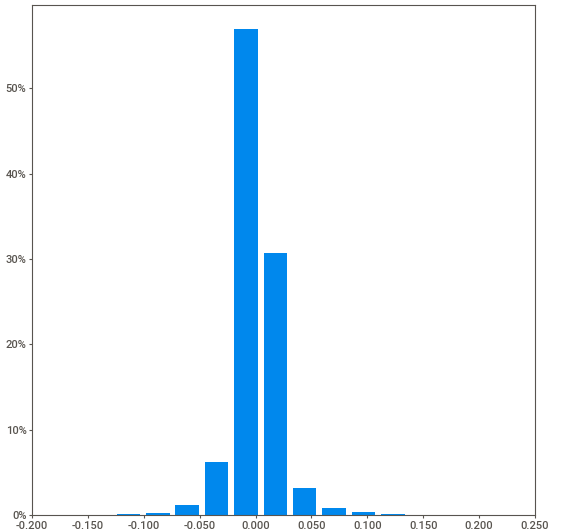
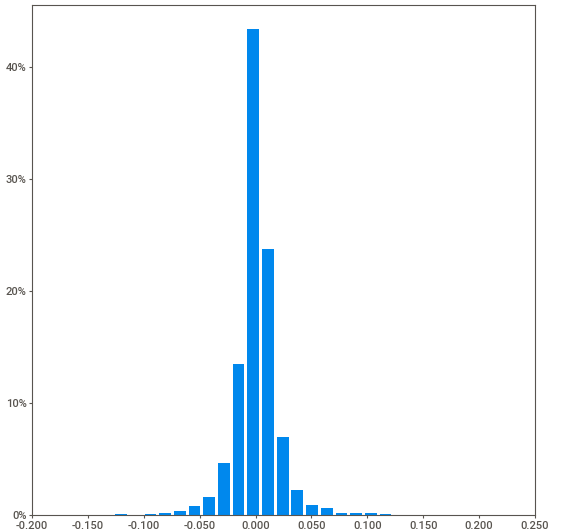
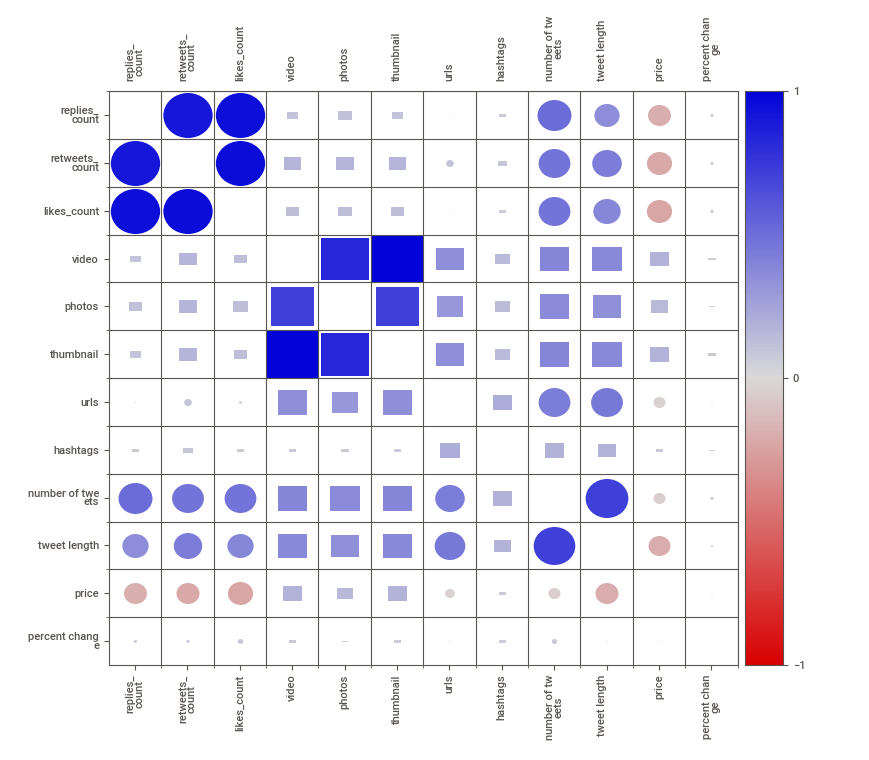
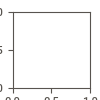

In [33]:
report = sv.analyze(data_trans)
report.show_notebook()

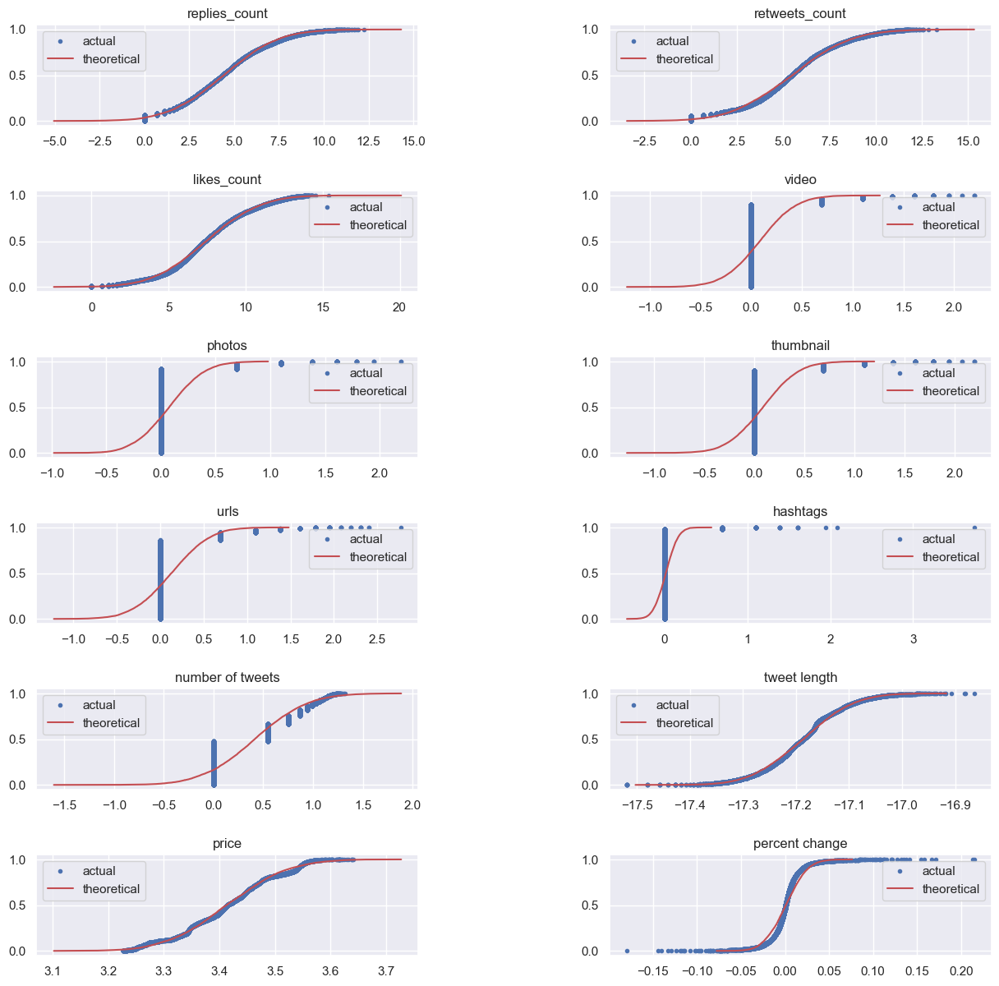

In [34]:
sns.set()
fig, ax = plt.subplots(6, 2, figsize = (15, 15))

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.65)
for i in range(6):
      for j in range(2):
                
            x, y = ecdf(data_trans[columns[2*i+j]]) 
            x_theor, y_theor = cdf(data_trans[columns[2*i+j]])


            _ = ax[i,j].plot(x, y, marker='.', linestyle='none')
            _ = ax[i,j].plot(x_theor, y_theor, color='r')
            _ = ax[i,j].legend(['actual', 'theoretical'])
            _ = ax[i,j].set_title(columns[2*i+j])
plt.show()

In [35]:
log_1_cols = ['video', 'photos', 'thumbnail', 'urls', 'hashtags']

In [42]:
for column in log_1_cols:
    data_trans[column] = np.log(data[column]+1)

                                             |          | [  0%]   00:00 -> (? left)


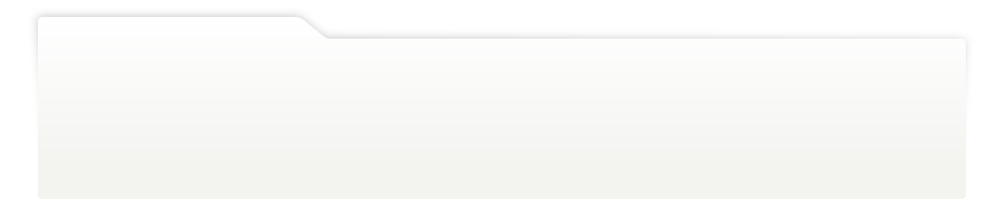
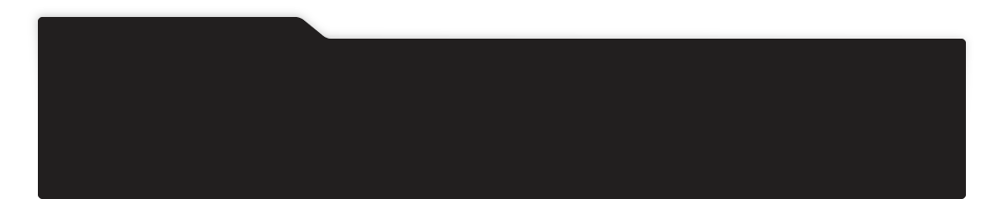
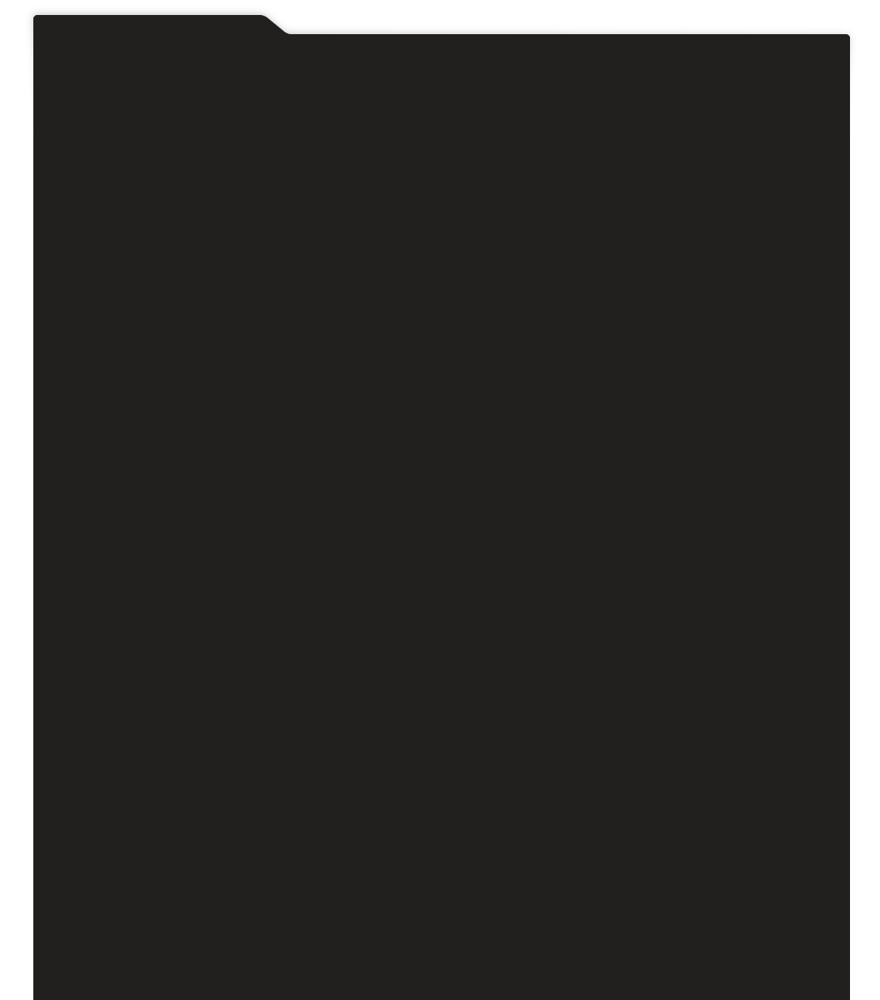
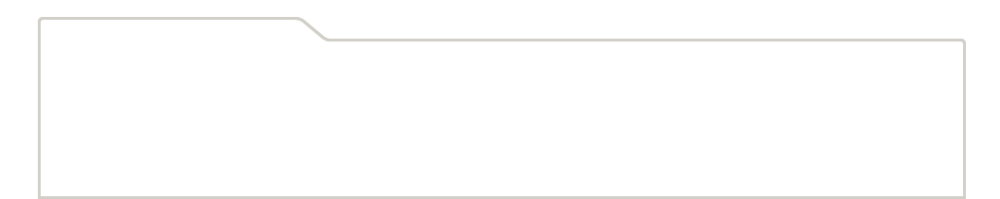
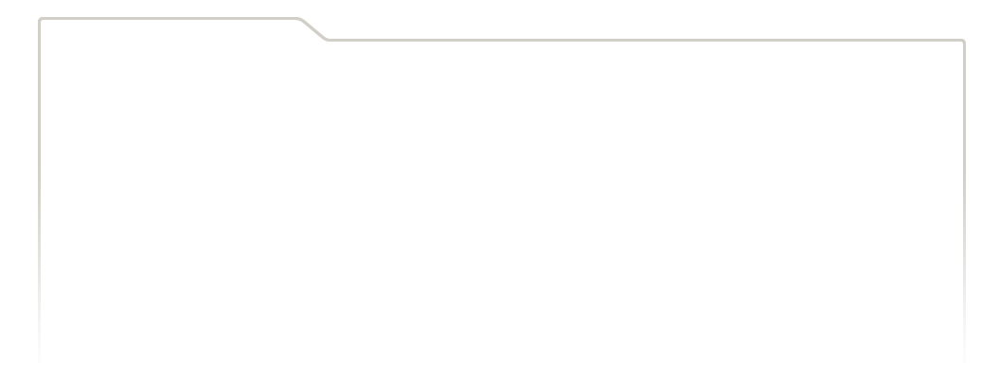
...
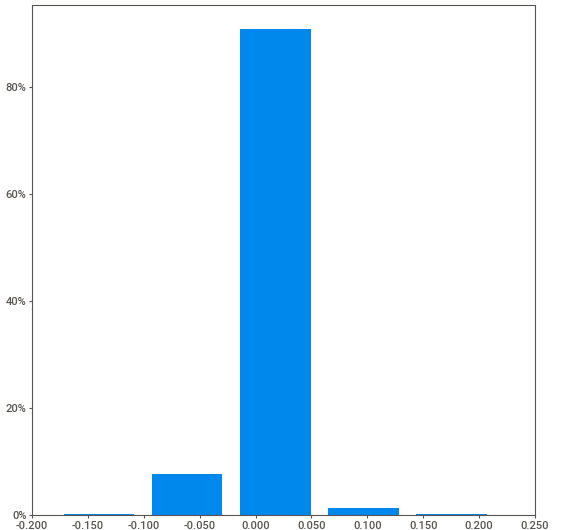
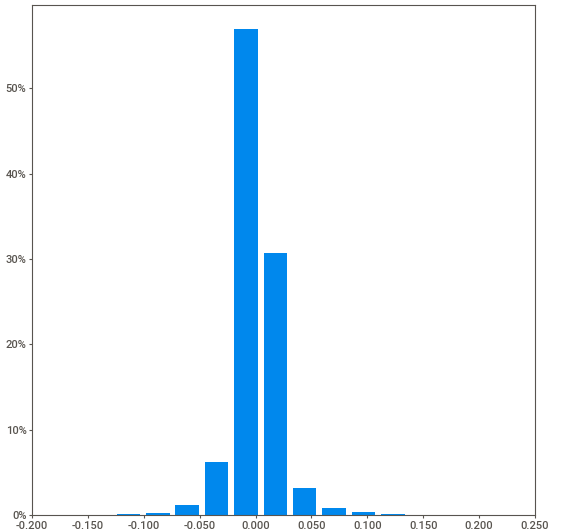
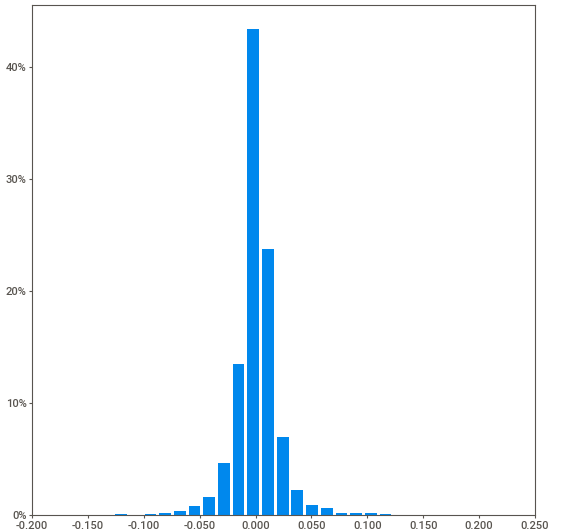
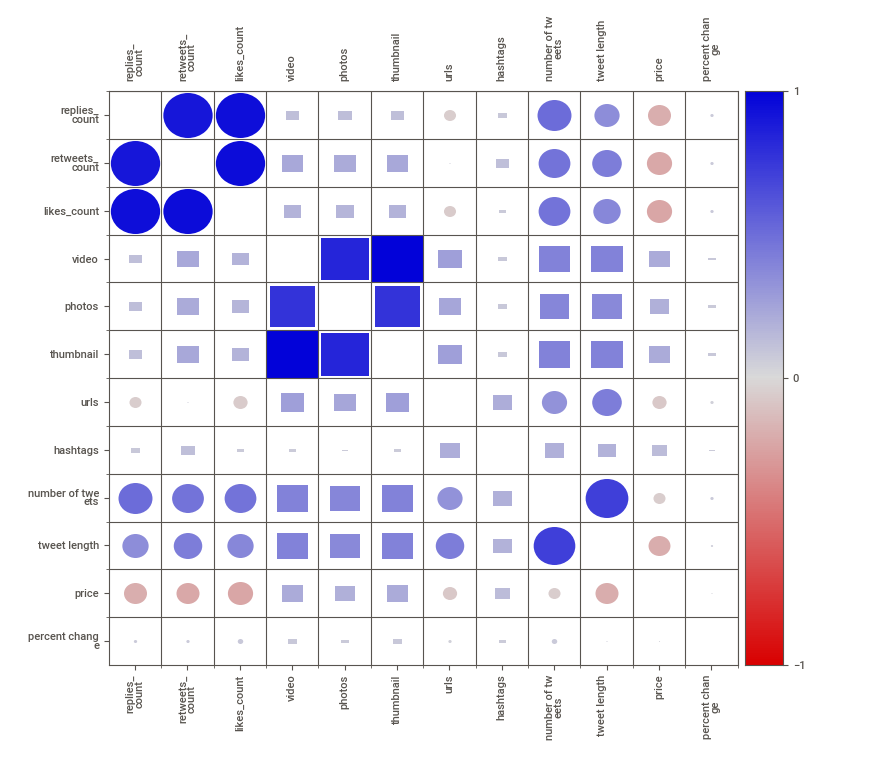
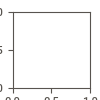

In [43]:
report = sv.analyze(data_trans)
report.show_notebook()

Let's scale the data

In [48]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled = scaler.fit_transform(data_trans)

In [50]:
scaled_df = pd.DataFrame(scaled, columns=data_trans.columns)

                                             |          | [  0%]   00:00 -> (? left)


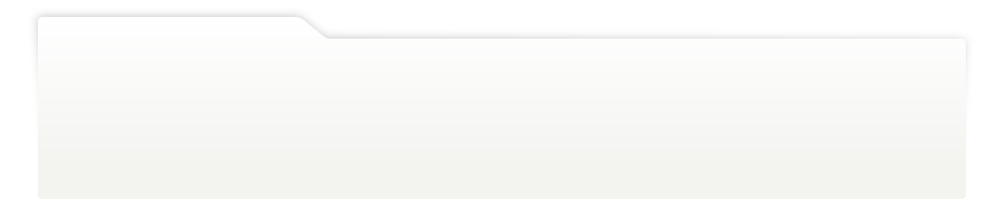
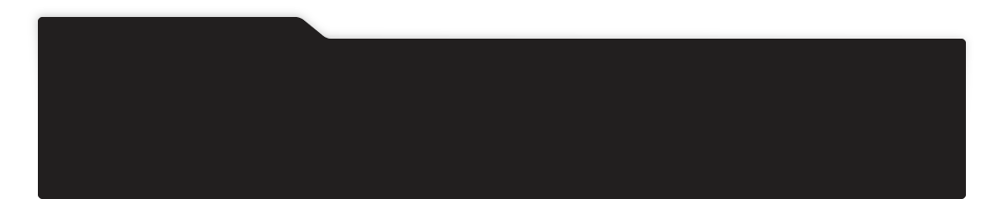
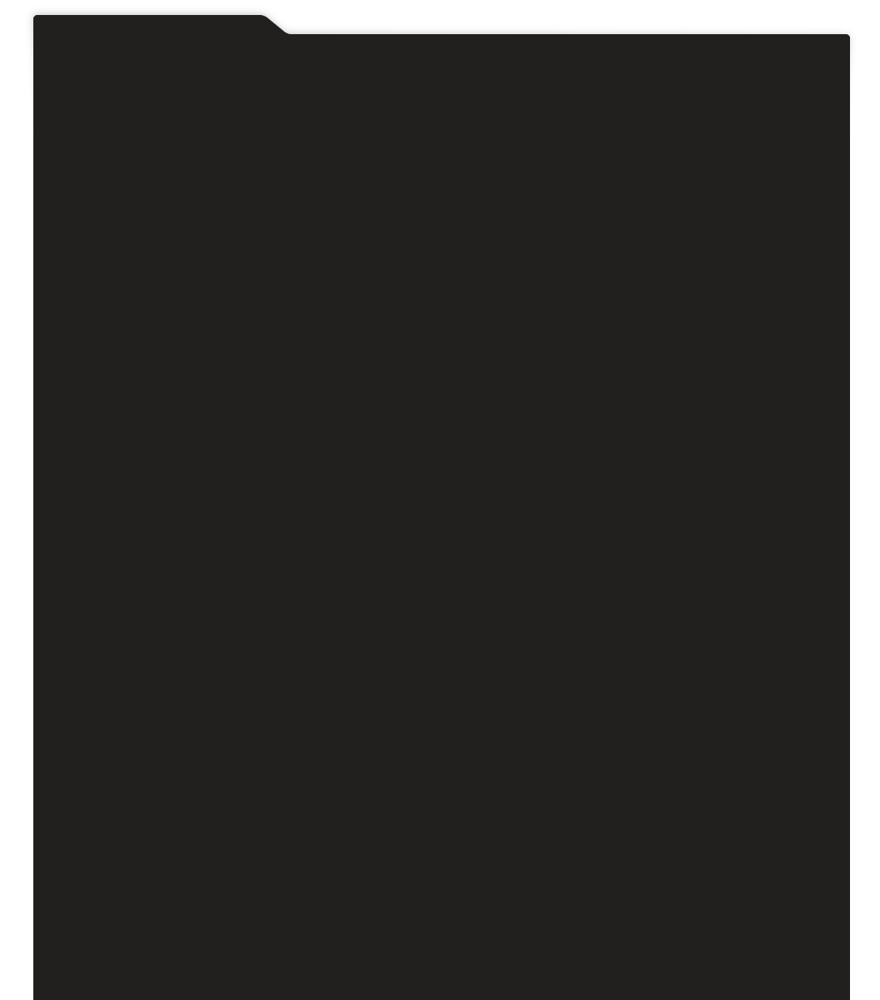
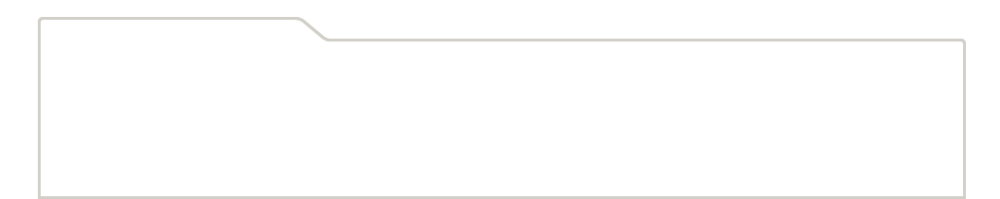
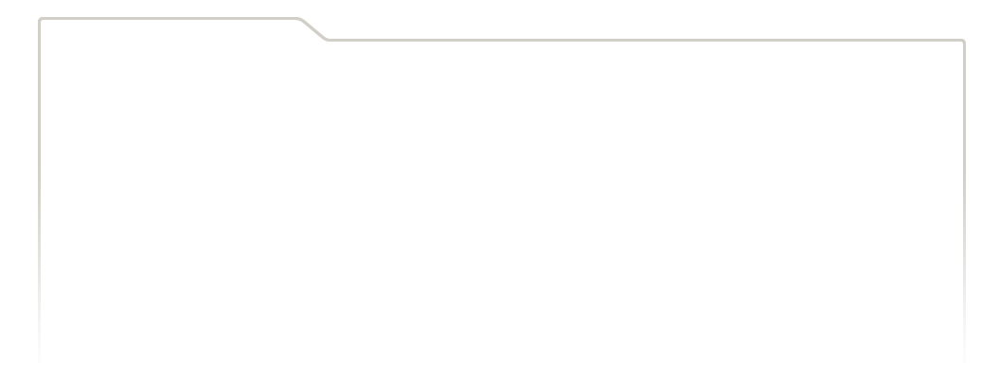
...
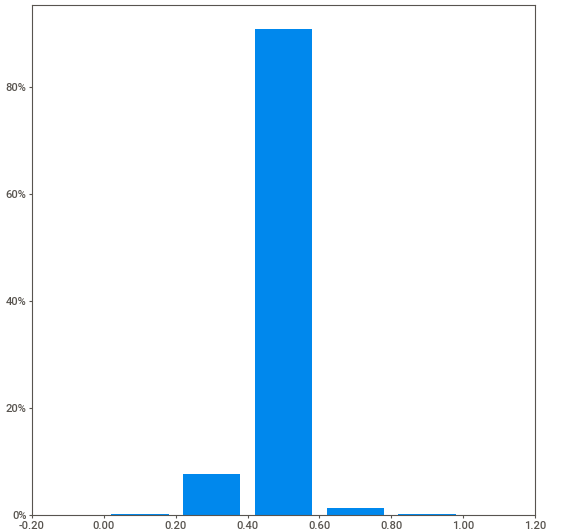
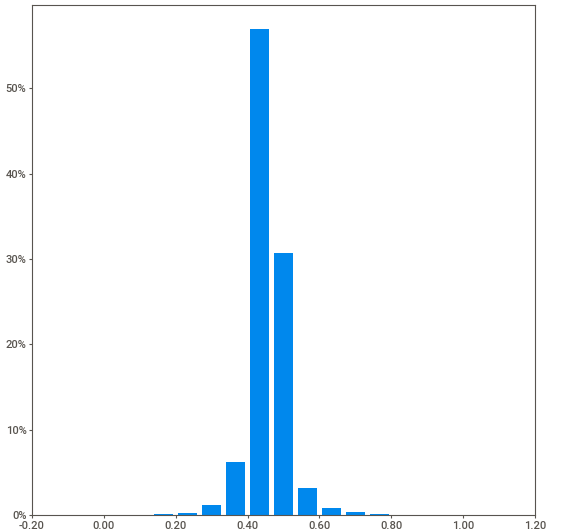
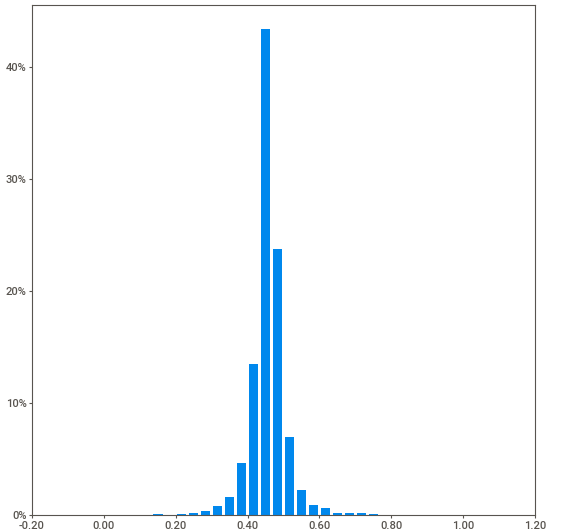
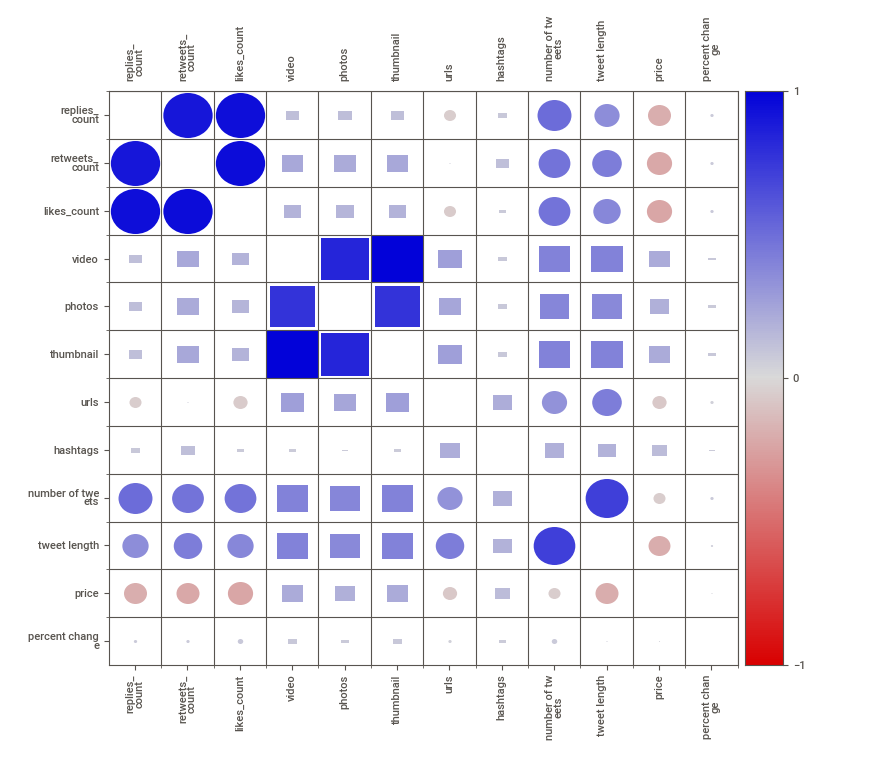
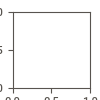

In [52]:
report = sv.analyze(scaled_df)
report.show_notebook()

Let's do some feature engineering

In [53]:
data_trans['cleaned tweet'] = tweets_stocks['cleaned tweet']
data_trans['pos/neg'] = ''
data_trans['pos/neg'][data_trans['percent change'] > 0 ] = 1
data_trans['pos/neg'][data_trans['percent change'] <= 0 ] = 0

"""for CEO in CEOS_transformed:
    CEOS_transformed[CEO]['pos/neg'] = ''
    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] > 0] = 1
    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] <= 0] = 0"""

<ipython-input-53-7e7f748e2dea>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trans['pos/neg'][data_trans['percent change'] > 0 ] = 1
<ipython-input-53-7e7f748e2dea>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trans['pos/neg'][data_trans['percent change'] <= 0 ] = 0


"for CEO in CEOS_transformed:\n    CEOS_transformed[CEO]['pos/neg'] = ''\n    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] > 0] = 1\n    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] <= 0] = 0"

In [54]:
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/tylerpoore/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [55]:
data_trans['sentiment'] = data_trans['cleaned tweet'].apply(lambda tweet: sid.polarity_scores(tweet))   

In [56]:
data_trans['sentiment'] = data_trans['sentiment'].apply(lambda score_dict: score_dict['compound'])

In [57]:
data_trans['readability'] = data_trans['cleaned tweet'].apply(textstat.flesch_kincaid_grade)
data_trans['readability'] = np.log(data_trans['readability'], where=data_trans['readability'] > 1)

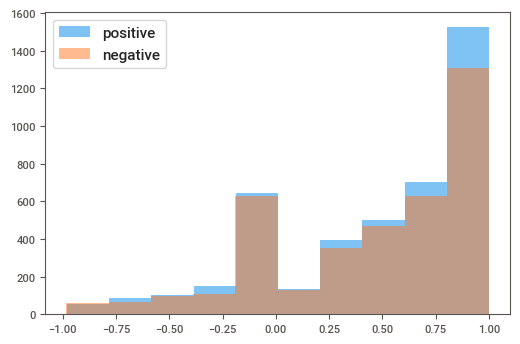

In [58]:
_ = plt.hist(data_trans[data_trans['pos/neg']==1]['sentiment'], alpha=0.5, label='positive')
_ = plt.hist(data_trans[data_trans['pos/neg']==0]['sentiment'], alpha=0.5, label='negative')
_ = plt.legend(loc='upper left')
plt.show()

In [60]:
report = sv.analyze(data_trans)

                                             |          | [  0%]   00:00 -> (? left)


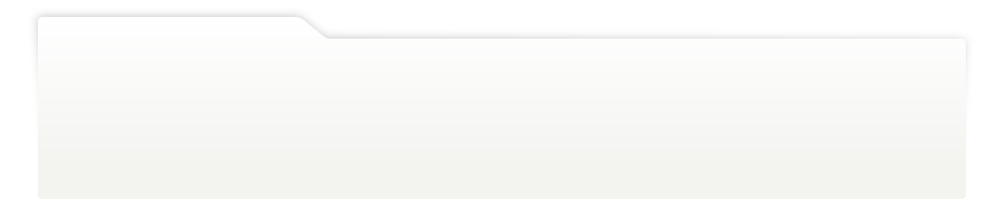
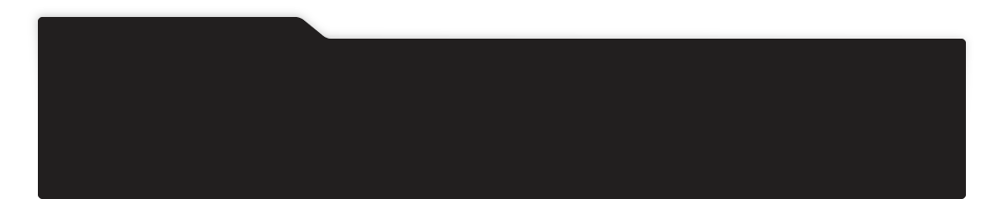
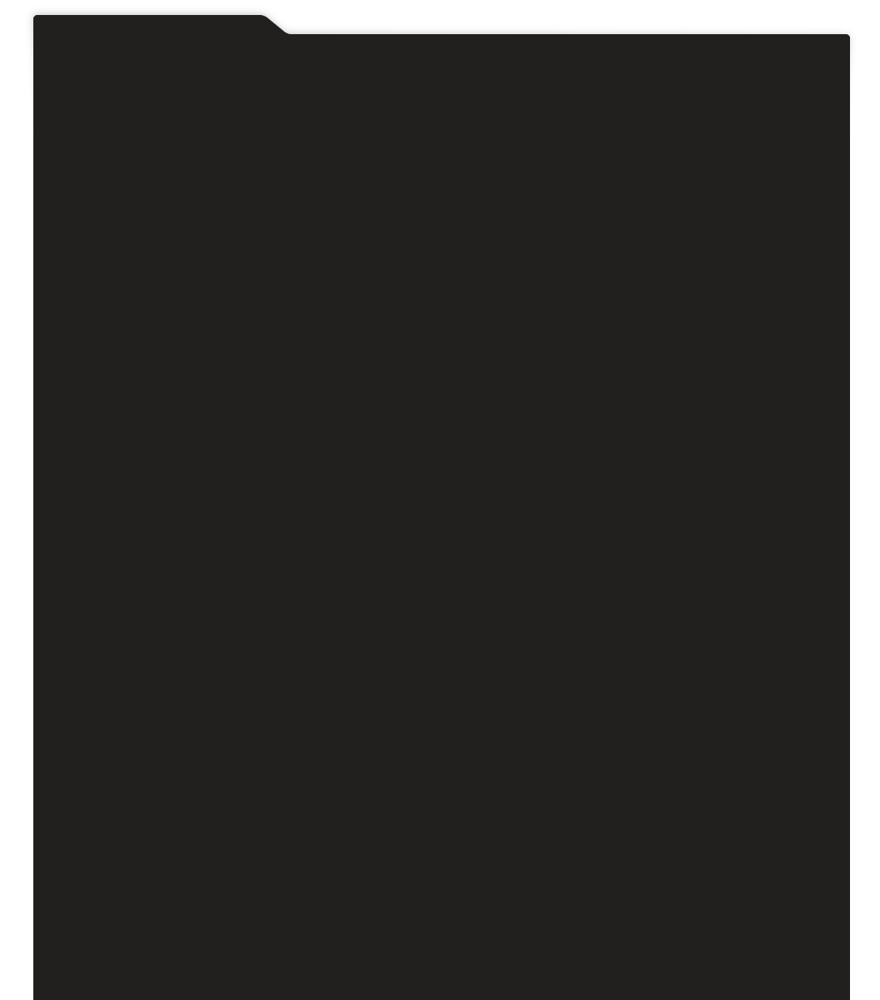
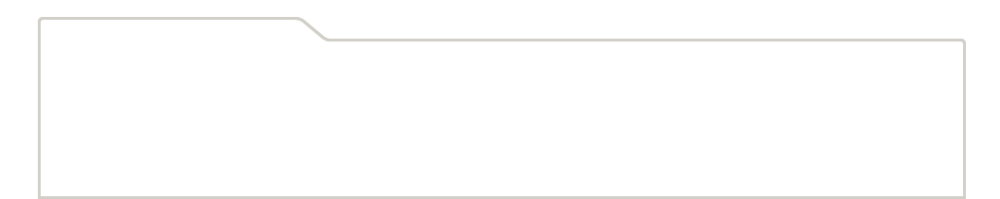
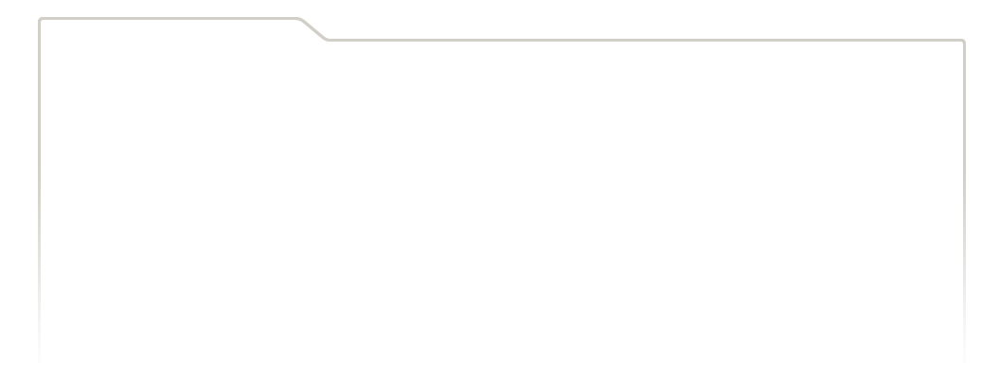
...
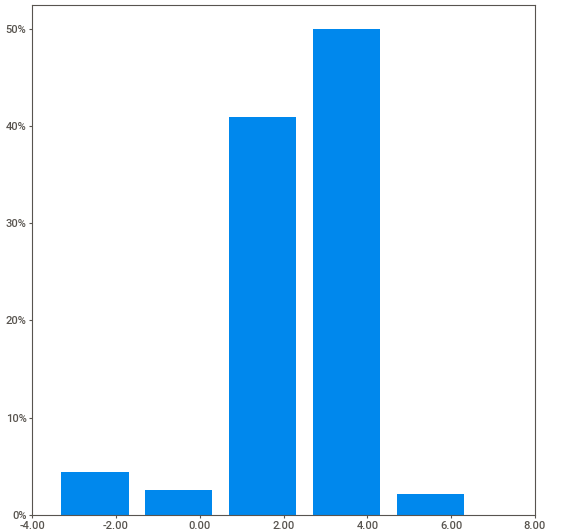
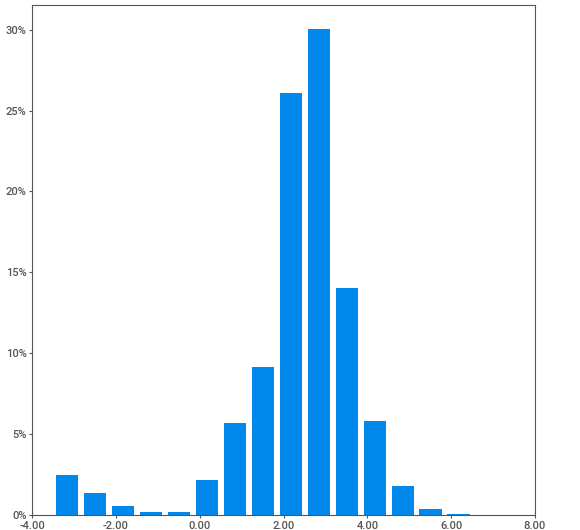
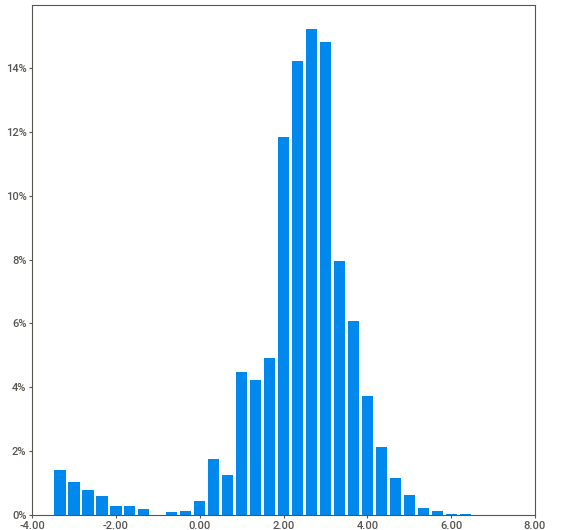
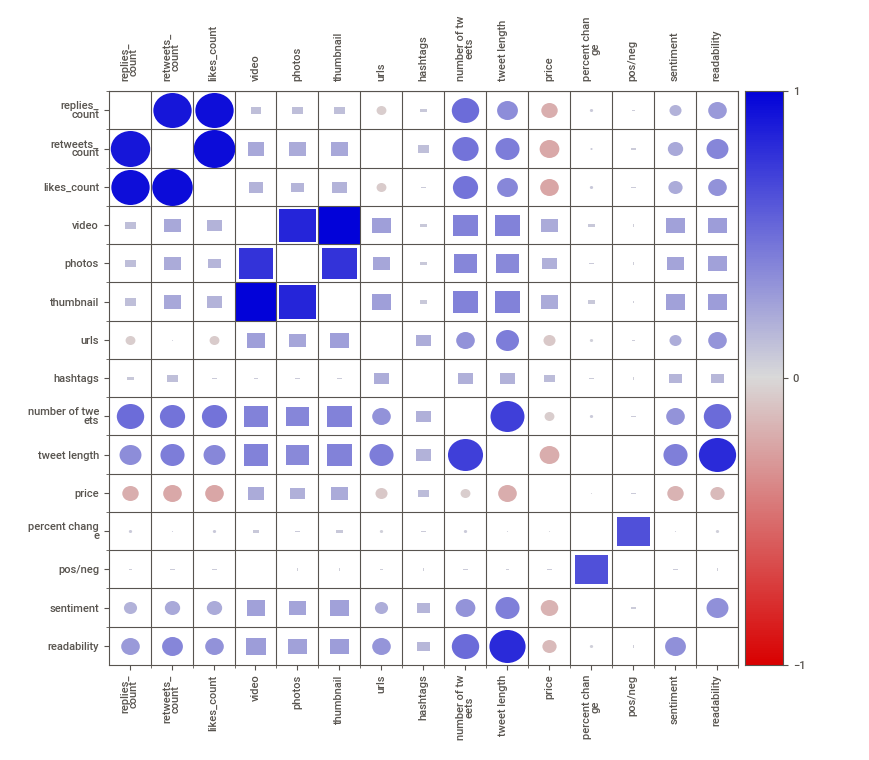
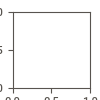

In [61]:
report.show_notebook()

In [70]:
pd.options.display.max_colwidth = 1000

In [71]:
data_trans['cleaned tweet'][data_trans['readability'] == data_trans['readability'].max()]

4943    no no need to be sorry i wasnt go eat thanks kara karajack i dont think youre mean always good to experiment karajack no ryan yep and they dont have to be wack need to figure this out this whole experience is a problem statement for what we need to fix karajack this thread was hard but we got to learn a ton to fix it need to make this feel a lot more cohesive and easier to follow was extremely challenging thank you for trying it with me know it wasnt easy will consider different formats karajack tried to do too much at once wasnt focused on what our one core strength was conversation that lead to really diluted strategy and approach and a ton of reactiveness karajack im focused on building leadership in both not my desire or ambition to be ceo of multiple companies just for the sake of that im doing everything i can to help both effort doesnt come down to one person its a team karajack i think its better to spread that responsibility across multiple people it creates less depen

In [74]:
data_trans['cleaned tweet'][data_trans['sentiment'] == data_trans['sentiment'].max()]

4215    us too copying others is not what i aspire us to be we will learn from others and do it in our own way biggest change and improvement is weekly in timeline its where it matters most and isnt conservative thanks we are simplifying the experience every opportunity we see need to simplify a lot here weve made a lot of progress there and yes we will always ask and listen were pretty confident thanks thank you yes same cool made a lot of progress here not and will never be done different tastes i guess but i think reddits app is best working on that agree we are looking into it we have that looking we havent declined and there are still a lot of amazing api developers today folded hands medium light skin tone not our decision always folded hands medium light skin tone talk w his decision not ours we have that with mit when we first started almost years ago we had this called it worship didnt last get it we will relook at this considered this agree looking a lot at replies how so maj

In [75]:
data_trans.drop('cleaned tweet', axis=1, inplace=True)
data_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8149 entries, 0 to 8148
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   replies_count     8149 non-null   float64
 1   retweets_count    8149 non-null   float64
 2   likes_count       8149 non-null   float64
 3   video             8149 non-null   float64
 4   photos            8149 non-null   float64
 5   thumbnail         8149 non-null   float64
 6   urls              8149 non-null   float64
 7   hashtags          8149 non-null   float64
 8   number of tweets  8149 non-null   float64
 9   tweet length      8149 non-null   float64
 10  price             8149 non-null   float64
 11  percent change    8149 non-null   float64
 12  pos/neg           8149 non-null   object 
 13  sentiment         8149 non-null   float64
 14  readability       8149 non-null   float64
dtypes: float64(14), object(1)
memory usage: 955.1+ KB


In [77]:
from sklearn.preprocessing import scale

In [79]:
scale_df = pd.DataFrame(scale(data_trans), columns = data_trans.columns)

In [81]:
scale_df.describe()

,replies_count,retweets_count,likes_count,video,photos,thumbnail,urls,hashtags,number of tweets,tweet length,price,percent change,pos/neg,sentiment,readability
count,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03,8.149000e+03
mean,-1.953142e-16,2.511183e-16,8.370610e-17,2.790203e-17,4.185305e-17,2.790203e-17,4.185305e-17,-5.580407e-17,8.370610e-17,5.446477e-14,-5.189778e-15,-8.719386e-18,6.016376e-17,4.185305e-17,-3.627264e-16
std,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00,1.000061e+00
min,-1.801604e+00,-2.093977e+00,-2.688682e+00,-6.242440e-01,-5.918414e-01,-6.242440e-01,-7.945111e-01,-3.794512e-01,-9.739996e-01,-4.308082e+00,-2.156536e+00,-8.928713e+00,-1.055664e+00,-3.159096e+00,-3.994743e+00
25%,-7.031290e-01,-5.770088e-01,-6.023859e-01,-6.242440e-01,-5.918414e-01,-6.242440e-01,-7.945111e-01,-3.794512e-01,-9.739996e-01,-6.263635e-01,-7.566068e-01,-3.860752e-01,-1.055664e+00,-9.609155e-01,-2.442157e-01
50%,-2.921116e-02,8.556202e-03,-3.849140e-02,-6.242440e-01,-5.918414e-01,-6.242440e-01,-7.945111e-01,-3.794512e-01,2.944919e-01,1.356996e-02,6.045868e-03,-8.047584e-03,9.472711e-01,3.118176e-01,1.446171e-01
75%,6.514104e-01,6.254893e-01,6.391794e-01,9.576603e-01,1.091123e+00,9.576603e-01,6.308206e-01,-3.794512e-01,7.856847e-01,5.947085e-01,6.764748e-01,3.711479e-01,9.472711e-01,8.629825e-01,4.989080e-01
max,3.160619e+00,3.004332e+00,2.844328e+00,4.630728e+00,4.998846e+00,4.630728e+00,5.031479e+00,1.349722e+01,2.119669e+00,4.186312e+00,2.601343e+00,1.058154e+01,9.472711e-01,1.121719e+00,2.865444e+00


                                             |          | [  0%]   00:00 -> (? left)


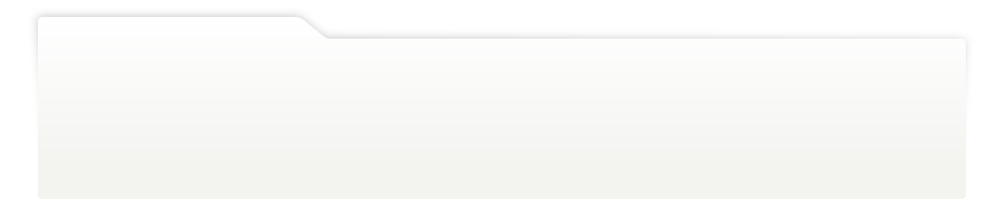
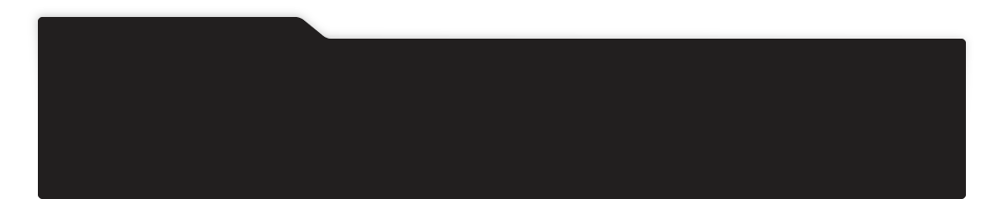
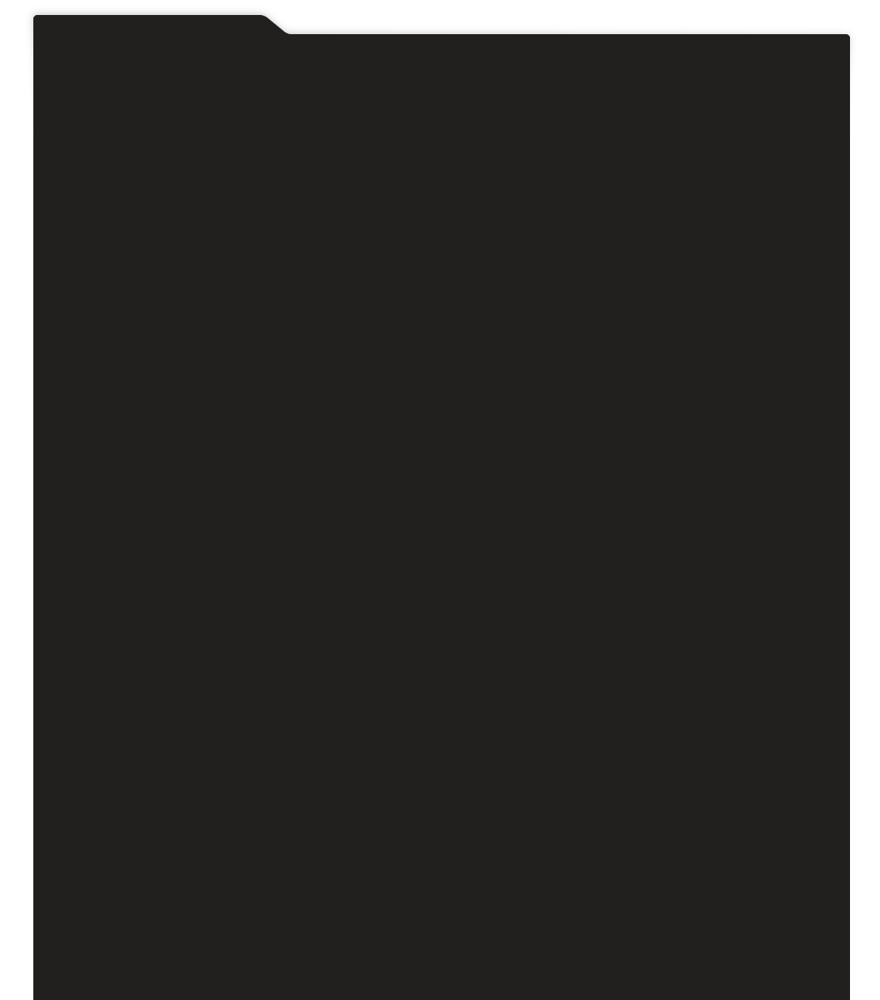
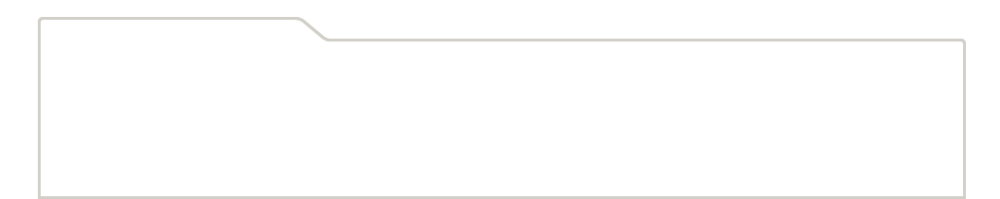
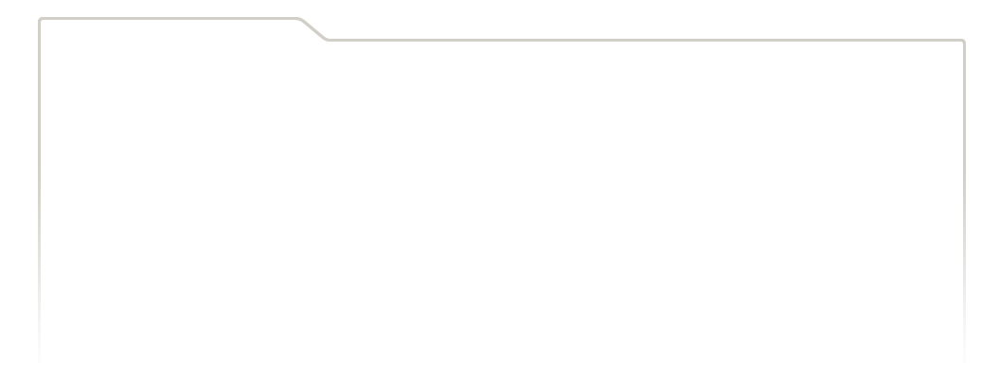
...
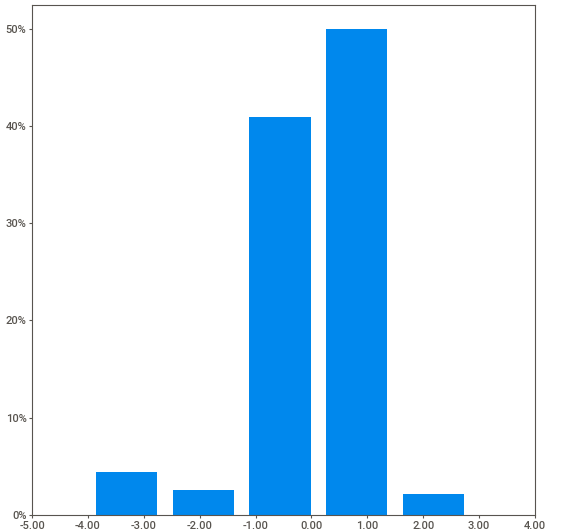
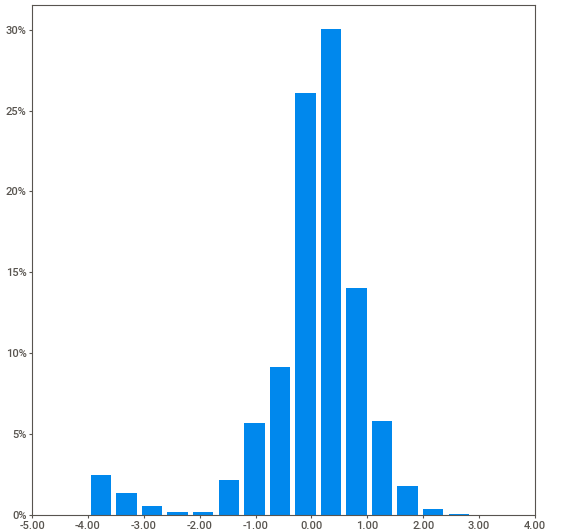
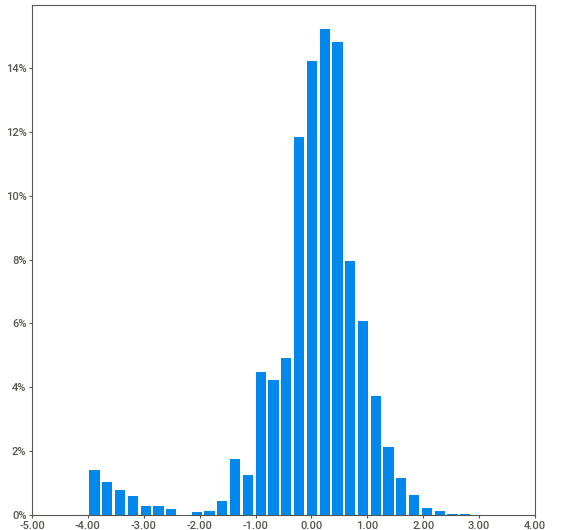
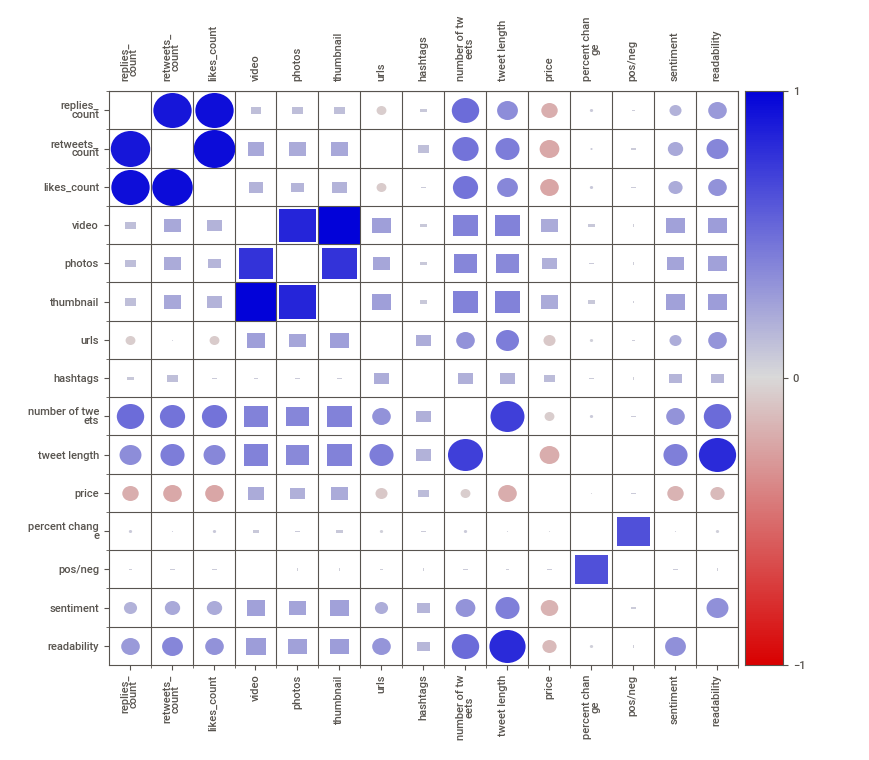
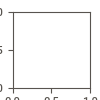

In [82]:
report = sv.analyze(scale_df)
report.show_notebook()

In [83]:
# Apply the tranformations to the CEOS dictionary and get ready for text analysis and feature engineering

CEOS_transformed = CEOS
log_cols = ['replies_count', 'retweets_count', 'likes_count']
log_1_cols = ['video', 'photos', 'thumbnail', 'urls', 'hashtags']

In [85]:
for CEO in CEOS_transformed:
    
    # apply pos/neg label
    CEOS_transformed[CEO]['pos/neg'] = ''
    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] > 0 ] = 1
    CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] <= 0 ] = 0
    
    # get readability
    CEOS_transformed[CEO]['readability'] = CEOS_transformed[CEO]['cleaned tweet'].apply(textstat.flesch_kincaid_grade)
    
    # get sentiment
    CEOS_transformed[CEO]['sentiment'] = CEOS_transformed[CEO]['cleaned tweet'].apply(lambda tweet: sid.polarity_scores(tweet))
    CEOS_transformed[CEO]['sentiment'] = CEOS_transformed[CEO]['sentiment'].apply(lambda score_dict: score_dict['compound'])
    
    # apply log transformations
    data_trans['number of tweets'] = ((data['number of tweets']**-.738-1)/-.738)
    data_trans['tweet length'] = ((data['tweet length']**0.054-1/.054))
    data_trans['price'] = ((data['price']**-.318-1/-.318))
    
    CEOS_transformed[CEO][log_cols] = np.log(CEOS_transformed[CEO][log_cols], where=CEOS_transformed[CEO][log_cols]>=1)
    CEOS_transformed[CEO][log_1_cols] = np.log(CEOS_transformed[CEO][log_1_cols]+1)

<ipython-input-85-f2b8a2ce5f20>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] > 0 ] = 1
<ipython-input-85-f2b8a2ce5f20>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CEOS_transformed[CEO]['pos/neg'][CEOS_transformed[CEO]['percent change'] <= 0 ] = 0
<ipython-input-85-f2b8a2ce5f20>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CEOS_transformed[CEO]['pos/ne

In [86]:
for i in range(len(CEOS_list)):
    CEOS_transformed[CEOS_list[i]].to_pickle(f'/Users/tylerpoore/Workspace/Spring Board/Projects/Capstone_notebooks/{CEOS_list[i]}_df_transformed.pkl')